 
# Coronavirus (COVID-19) Visualization & Prediction **texto en negrita**

 Este cuaderno tiene como objetivo explorar COVID-19 a través del análisis de datos y predicciones.

Los datos de casos de coronavirus son proporcionados por la Universidad Johns Hopkins
Obtenga más información de la Organización Mundial de la Salud
Obtenga más información de los Centros para el Control y la Prevención de Enfermedades


Última actualización: 23/10/2022 18:49 ET. Nuevas actualizaciones: actualización de datos del informe diario para **22/10/22**. actualización de datos de serie temporal para **22/10/22** Se eliminaron los datos de movilidad de Apple porque ya no son compatibles. *texto en cursiva*

In [258]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
plt.style.use('seaborn-poster')
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('retina')
import warnings
warnings.filterwarnings("ignore")

Importamos el conjunto de datos para cada situación medica del covid

In [259]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/08-25-2022.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/08-25-2022.csv')

In [260]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key,Incident_Rate,Case_Fatality_Ratio
0,NaN,NaN,NaN,Afghanistan,2022-08-26 04:21:02,33.93911,67.709953,191967,7771,NaN,NaN,Afghanistan,493.129157,4.048092
1,NaN,NaN,NaN,Albania,2022-08-26 04:21:02,41.15330,20.168300,327607,3579,NaN,NaN,Albania,11383.939120,1.092467
2,NaN,NaN,NaN,Algeria,2022-08-26 04:21:02,28.03390,1.659600,270097,6878,NaN,NaN,Algeria,615.942020,2.546493
3,NaN,NaN,NaN,Andorra,2022-08-26 04:21:02,42.50630,1.521800,46027,154,NaN,NaN,Andorra,59570.309972,0.334586
4,NaN,NaN,NaN,Angola,2022-08-26 04:21:02,-11.20270,17.873900,102636,1917,NaN,NaN,Angola,312.283707,1.867766


In [261]:
confirmed_df.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/4/22,12/5/22,12/6/22,12/7/22,12/8/22,12/9/22,12/10/22,12/11/22,12/12/22,12/13/22
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,206206,206273,206331,206414,206465,206504,206543,206603,206702,206743
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,333408,333413,333455,333472,333490,333491,333521,333533,333535,333567
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,271107,271113,271122,271128,271135,271140,271146,271146,271147,271149
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,47219,47219,47219,47446,47446,47446,47446,47446,47446,47446
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,104676,104750,104750,104808,104808,104808,104808,104808,104808,104808


In [262]:
us_medical_data.head()

,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,FIPS,...,Total_Test_Results,People_Hospitalized,Case_Fatality_Ratio,UID,ISO3,Testing_Rate,Hospitalization_Rate,Date,People_Tested,Mortality_Rate
0,Alabama,US,2022-08-26 04:34:15,32.3182,-86.9023,1479605,20048,NaN,NaN,1.0,...,NaN,NaN,1.354956,84000001.0,USA,NaN,NaN,2022-08-25,NaN,NaN
1,Alaska,US,2022-08-26 04:34:15,61.3707,-152.4044,293076,1338,NaN,NaN,2.0,...,NaN,NaN,0.456537,84000002.0,USA,NaN,NaN,2022-08-25,NaN,NaN
2,American Samoa,US,2022-08-26 04:34:15,-14.2710,-170.1320,8168,34,NaN,NaN,60.0,...,NaN,NaN,0.416259,16.0,ASM,NaN,NaN,2022-08-25,NaN,NaN
3,Arizona,US,2022-08-26 04:34:15,33.7298,-111.4312,2245713,31047,NaN,NaN,4.0,...,20585287.0,NaN,1.382501,84000004.0,USA,282814.773538,NaN,2022-08-25,NaN,NaN
4,Arkansas,US,2022-08-26 04:34:15,34.9697,-92.3731,927072,11887,NaN,NaN,5.0,...,5435506.0,NaN,1.282209,84000005.0,USA,180114.613143,NaN,2022-08-25,NaN,NaN


In [263]:
confirmed_cols = confirmed_df.keys()
deaths_cols = deaths_df.keys()

Obtenemos  todas las fechas de la pandemia de coronavirus en curso

In [264]:
confirmed = confirmed_df.loc[:, confirmed_cols[4]:]
deaths = deaths_df.loc[:, deaths_cols[4]:]

In [265]:
confirmed.keys()

Index(['1/22/20', '1/23/20', '1/24/20', '1/25/20', '1/26/20', '1/27/20',
       '1/28/20', '1/29/20', '1/30/20', '1/31/20',
       ...
       '12/4/22', '12/5/22', '12/6/22', '12/7/22', '12/8/22', '12/9/22',
       '12/10/22', '12/11/22', '12/12/22', '12/13/22'],
      dtype='object', length=1057)

In [266]:
num_dates = len(confirmed.keys())
ck = confirmed.keys()
dk = deaths.keys()

world_cases = []
total_deaths = [] 
mortality_rate = []


for i in range(num_dates):
    confirmed_sum = confirmed[ck[i]].sum()
    death_sum = deaths[dk[i]].sum()
    
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)

"suma de confirmados:",confirmed_sum, "suma de muertes:",death_sum

('suma de confirmados:', 650428392, 'suma de muertes:', 6656422)


Obtener incrementos diarios y promedios 

In [267]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

def moving_average(data, window_size):
    moving_average = []
    for i in range(len(data)):
        if i + window_size < len(data):
            moving_average.append(np.mean(data[i:i+window_size]))
        else:
            moving_average.append(np.mean(data[i:len(data)]))
    return moving_average

# window size
window = 7

# confirmed cases
world_daily_increase = daily_increase(world_cases)
world_confirmed_avg= moving_average(world_cases, window)
world_daily_increase_avg = moving_average(world_daily_increase, window)

# deaths
world_daily_death = daily_increase(total_deaths)
world_death_avg = moving_average(total_deaths, window)
world_daily_death_avg = moving_average(world_daily_death, window)

In [268]:
days_since_1_22 = np.array([i for i in range(len(ck))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)


Pronóstico futuro

In [269]:
days_in_future = 10
future_forcast = np.array([i for i in range(len(ck)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-10]



Convierta entero en fecha y hora para una mejor visualización

In [270]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

future_forcast_dates

['01/22/2020',
 '01/23/2020',
 '01/24/2020',
 '01/25/2020',
 '01/26/2020',
 '01/27/2020',
 '01/28/2020',
 '01/29/2020',
 '01/30/2020',
 '01/31/2020',
 '02/01/2020',
 '02/02/2020',
 '02/03/2020',
 '02/04/2020',
 '02/05/2020',
 '02/06/2020',
 '02/07/2020',
 '02/08/2020',
 '02/09/2020',
 '02/10/2020',
 '02/11/2020',
 '02/12/2020',
 '02/13/2020',
 '02/14/2020',
 '02/15/2020',
 '02/16/2020',
 '02/17/2020',
 '02/18/2020',
 '02/19/2020',
 '02/20/2020',
 '02/21/2020',
 '02/22/2020',
 '02/23/2020',
 '02/24/2020',
 '02/25/2020',
 '02/26/2020',
 '02/27/2020',
 '02/28/2020',
 '02/29/2020',
 '03/01/2020',
 '03/02/2020',
 '03/03/2020',
 '03/04/2020',
 '03/05/2020',
 '03/06/2020',
 '03/07/2020',
 '03/08/2020',
 '03/09/2020',
 '03/10/2020',
 '03/11/2020',
 '03/12/2020',
 '03/13/2020',
 '03/14/2020',
 '03/15/2020',
 '03/16/2020',
 '03/17/2020',
 '03/18/2020',
 '03/19/2020',
 '03/20/2020',
 '03/21/2020',
 '03/22/2020',
 '03/23/2020',
 '03/24/2020',
 '03/25/2020',
 '03/26/2020',
 '03/27/2020',
 '03/28/20


Estamos usando datos desde el 1/5/2022 hasta el presente para el modelo de predicción usted puede variar el inicio

In [271]:
# modifique ligeramente los datos para que se ajusten mejor al modelo (los modelos de regresión no pueden elegir el patrón), estamos usando datos del 1/4/22 en adelante para el modelo de predicción
days_to_skip = 830
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22[days_to_skip:], world_cases[days_to_skip:], test_size=0.10, shuffle=False) 


Modelo para predecir casos  confirmados. se usan la máquina de vectores de soporte, la cresta bayesiana y la regresión lineal en este ejemplo. Mostraremos los resultados en la sección posterior.

In [272]:
# # use this to find the optimal parameters for SVR
# c = [0.01, 0.1, 1]
# gamma = [0.01, 0.1, 1]
# epsilon = [0.01, 0.1, 1]
# shrinking = [True, False]

# svm_grid = {'C': c, 'gamma' : gamma, 'epsilon': epsilon, 'shrinking' : shrinking}

# svm = SVR(kernel='poly', degree=3)
# svm_search = RandomizedSearchCV(svm, svm_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=30, verbose=1)
# svm_search.fit(X_train_confirmed, y_train_confirmed)

In [273]:
# svm_search.best_params_

In [274]:
# svm_confirmed = svm_search.best_estimator_
svm_confirmed = SVR(shrinking=True, kernel='poly',gamma=0.01, epsilon=1,degree=3, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forcast)

MAE: 22268844.531690754
MSE: 501362792279404.8


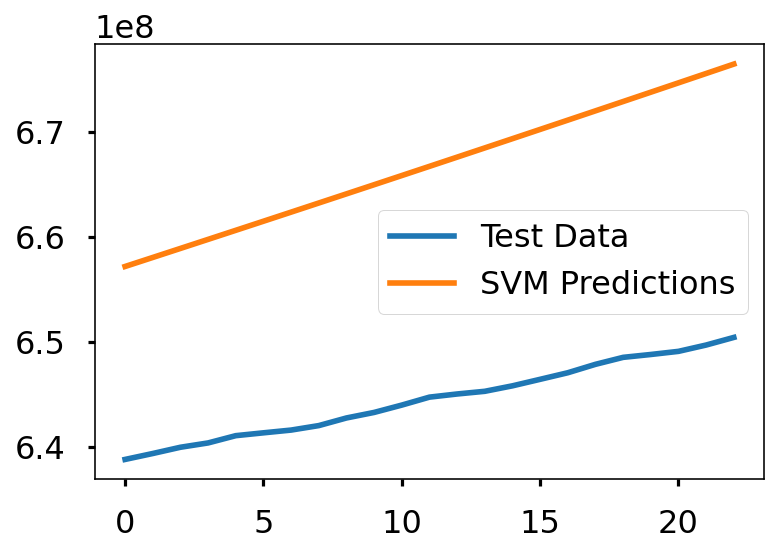

In [275]:
#checamos los datos de prueba
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))



In [276]:
#transformar nuestros datos para la regresión polinomial
poly = PolynomialFeatures(degree=3)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forcast = poly.fit_transform(future_forcast)

bayesian_poly = PolynomialFeatures(degree=3)
bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_poly_future_forcast = bayesian_poly.fit_transform(future_forcast)

In [277]:
# pregresión polinomial
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forcast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))

MAE: 13450505.853777016
MSE: 209299267617781.66


In [278]:
print(linear_model.coef_)

[[ 1.68271862e+10 -5.48740289e+07  6.07908506e+04 -2.21155656e+01]]


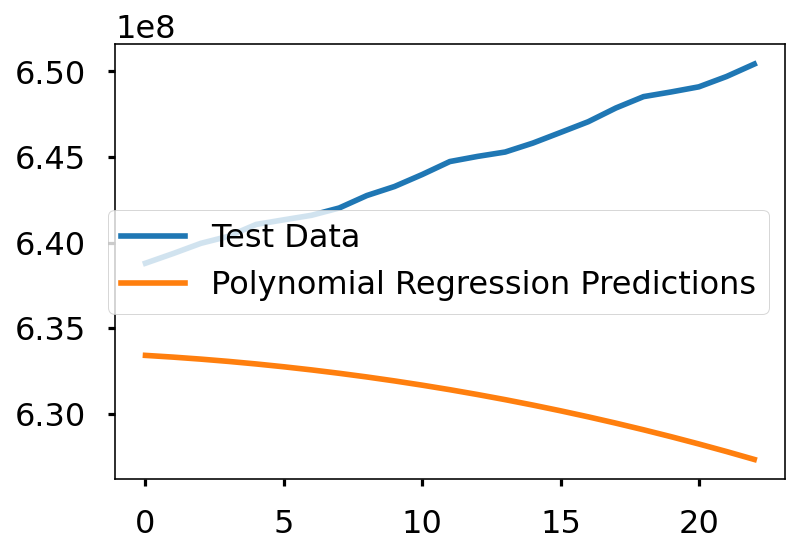

In [279]:
plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])

In [280]:
#regresión polinomial  bayesiana
tol = [1e-6, 1e-5, 1e-4, 1e-3, 1e-2]
alpha_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
alpha_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_1 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
lambda_2 = [1e-7, 1e-6, 1e-5, 1e-4, 1e-3]
normalize = [True, False]

bayesian_grid = {'tol': tol, 'alpha_1': alpha_1, 'alpha_2' : alpha_2, 'lambda_1': lambda_1, 'lambda_2' : lambda_2, 
                 'normalize' : normalize}

bayesian = BayesianRidge(fit_intercept=False)
bayesian_search = RandomizedSearchCV(bayesian, bayesian_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=40, verbose=1)
bayesian_search.fit(bayesian_poly_X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 40 candidates, totalling 120 fits


RandomizedSearchCV(cv=3, estimator=BayesianRidge(fit_intercept=False),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'alpha_1': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'alpha_2': [1e-07, 1e-06, 1e-05, 0.0001,
                                                    0.001],
                                        'lambda_1': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'lambda_2': [1e-07, 1e-06, 1e-05,
                                                     0.0001, 0.001],
                                        'normalize': [True, False],
                                        'tol': [1e-06, 1e-05, 0.0001, 0.001,
                                                0.01]},
                   return_train_score=True, scoring='neg_mean_squared_error',
                   verbose=1)

In [281]:
bayesian_search.best_params_

{'tol': 0.0001,
 'normalize': False,
 'lambda_2': 0.001,
 'lambda_1': 1e-07,
 'alpha_2': 1e-07,
 'alpha_1': 0.001}

In [282]:
bayesian_confirmed = bayesian_search.best_estimator_
test_bayesian_pred = bayesian_confirmed.predict(bayesian_poly_X_test_confirmed)
bayesian_pred = bayesian_confirmed.predict(bayesian_poly_future_forcast)
print('MAE:', mean_absolute_error(test_bayesian_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_bayesian_pred, y_test_confirmed))



MAE: 148725896.41588718
MSE: 2.2254438257570624e+16


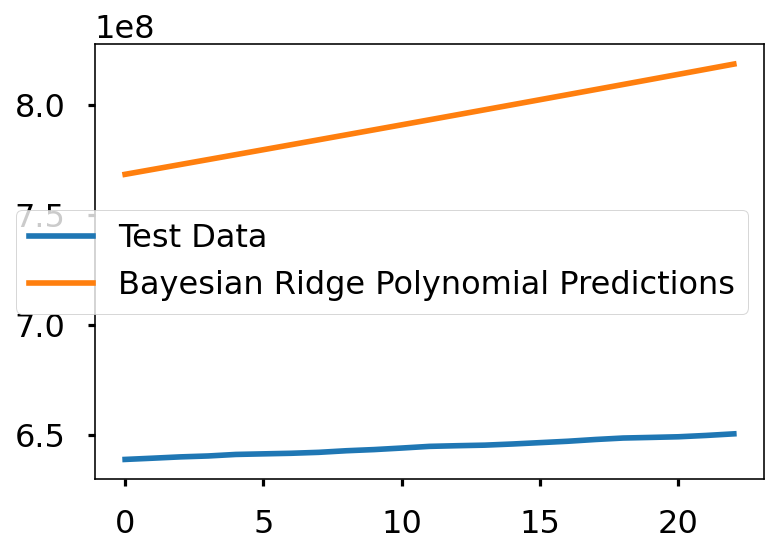

In [283]:
plt.plot(y_test_confirmed)
plt.plot(test_bayesian_pred)
plt.legend(['Test Data', 'Bayesian Ridge Polynomial Predictions'])

# Resumen mundial
Graficar el número de casos confirmados, muertes y tasa de mortalidad (CFR). Esto nos da una idea general de la pandemia en curso.
 <a id='world_wide_graphs'></a>

In [284]:
# método auxiliar para aplanar los datos, de modo que se puedan mostrar en un gráfico de barras
def flatten(arr):
    a = [] 
    arr = arr.tolist()
    for i in arr:
        a.append(i[0])
    return a

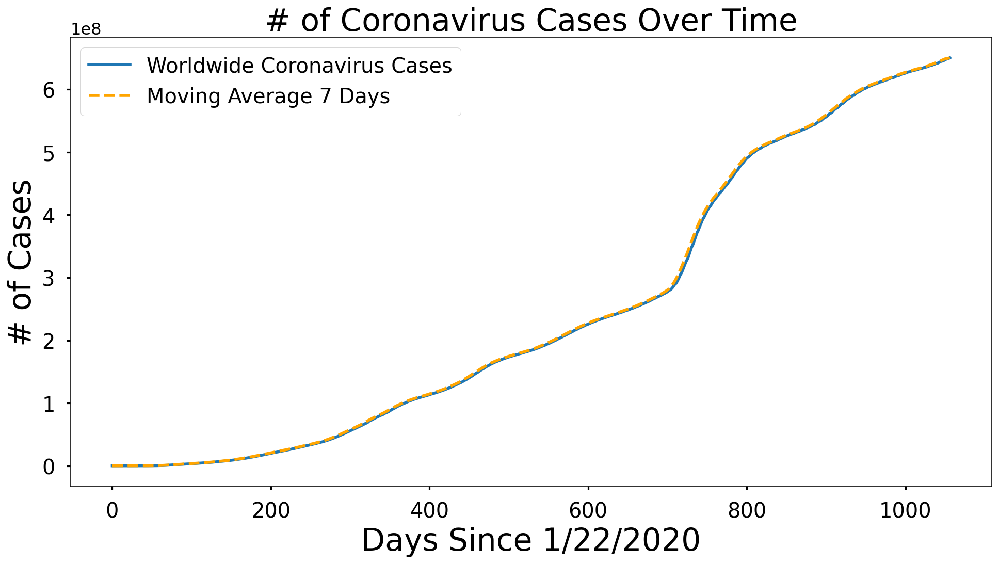

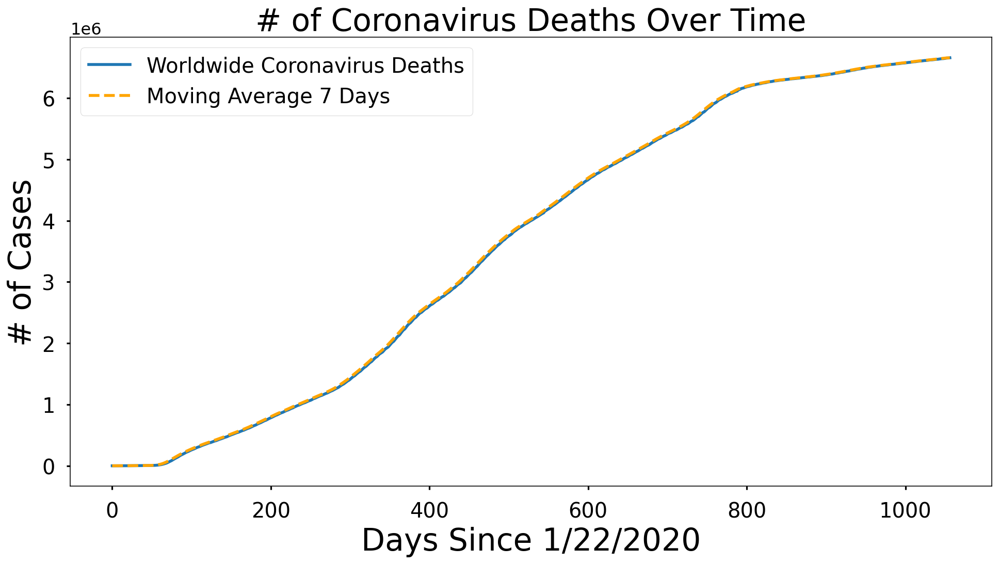

In [285]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 8))
plt.plot(adjusted_dates, world_cases)
plt.plot(adjusted_dates, world_confirmed_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Cases', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 8))
plt.plot(adjusted_dates, total_deaths)
plt.plot(adjusted_dates, world_death_avg, linestyle='dashed', color='orange')
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Worldwide Coronavirus Deaths', 'Moving Average {} Days'.format(window)], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

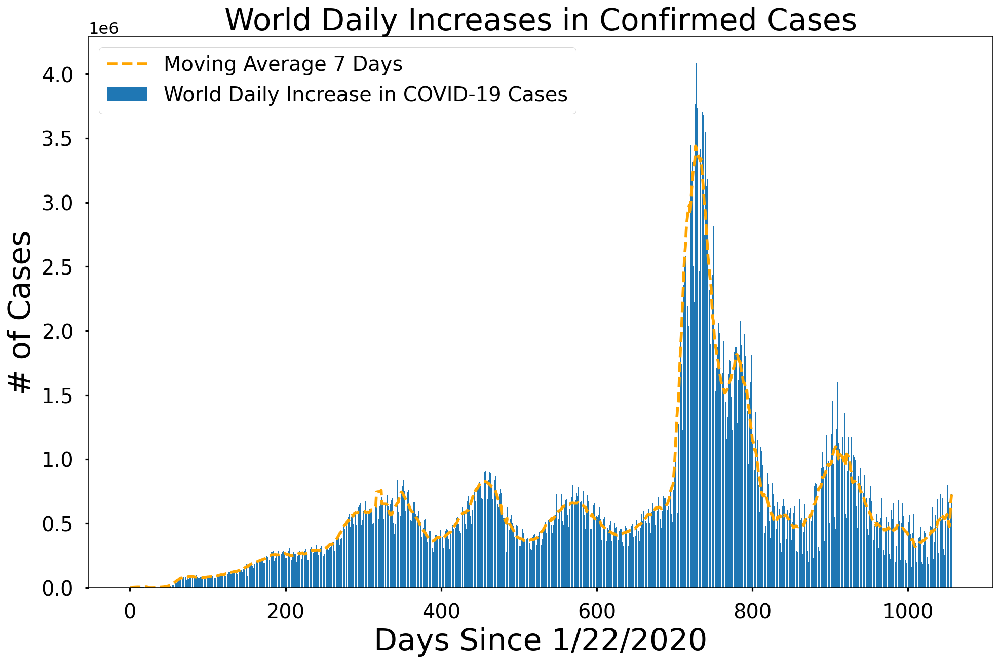

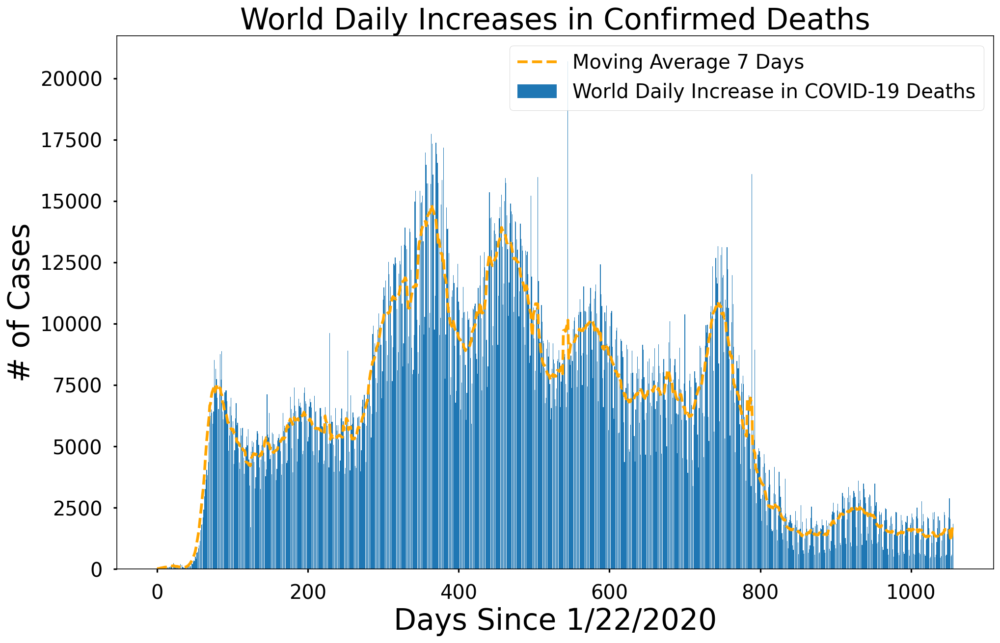

In [286]:
plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_increase)
plt.plot(adjusted_dates, world_daily_increase_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Cases', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Cases'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.bar(adjusted_dates, world_daily_death)
plt.plot(adjusted_dates, world_daily_death_avg, color='orange', linestyle='dashed')
plt.title('World Daily Increases in Confirmed Deaths', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Deaths'], prop={'size': 20})
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

# plt.figure(figsize=(16, 10))
# plt.bar(adjusted_dates, world_daily_recovery)
# plt.plot(adjusted_dates, world_daily_recovery_avg, color='orange', linestyle='dashed')
# plt.title('World Daily Increases in Confirmed Recoveries', size=30)
# plt.xlabel('Days Since 1/22/2020', size=30)
# plt.ylabel('# of Cases', size=30)
# plt.legend(['Moving Average {} Days'.format(window), 'World Daily Increase in COVID-19 Recoveries'], prop={'size': 20})
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()

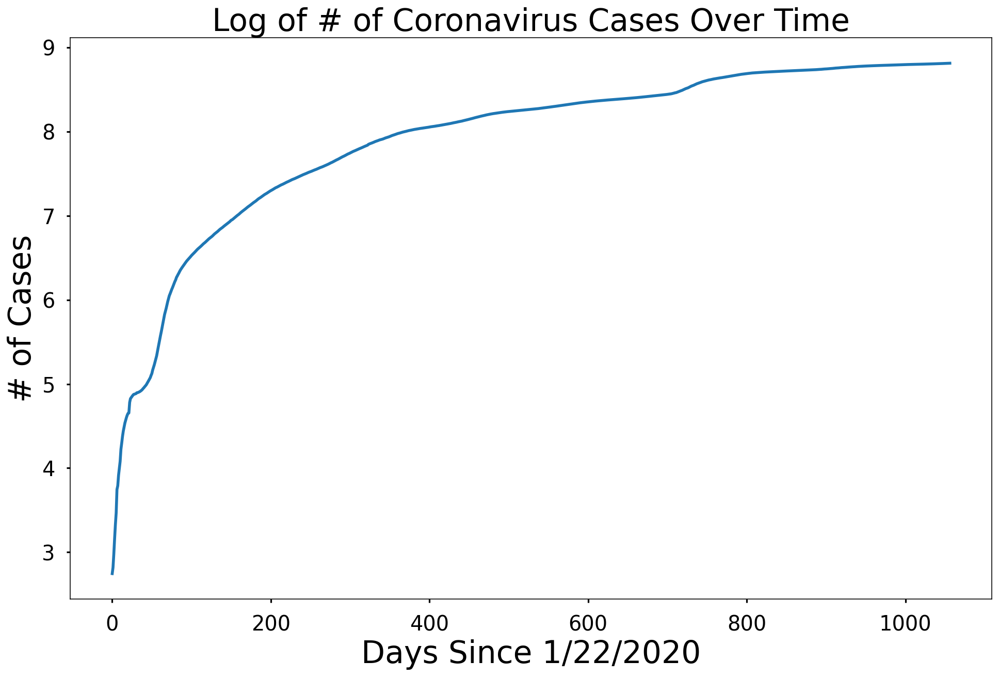

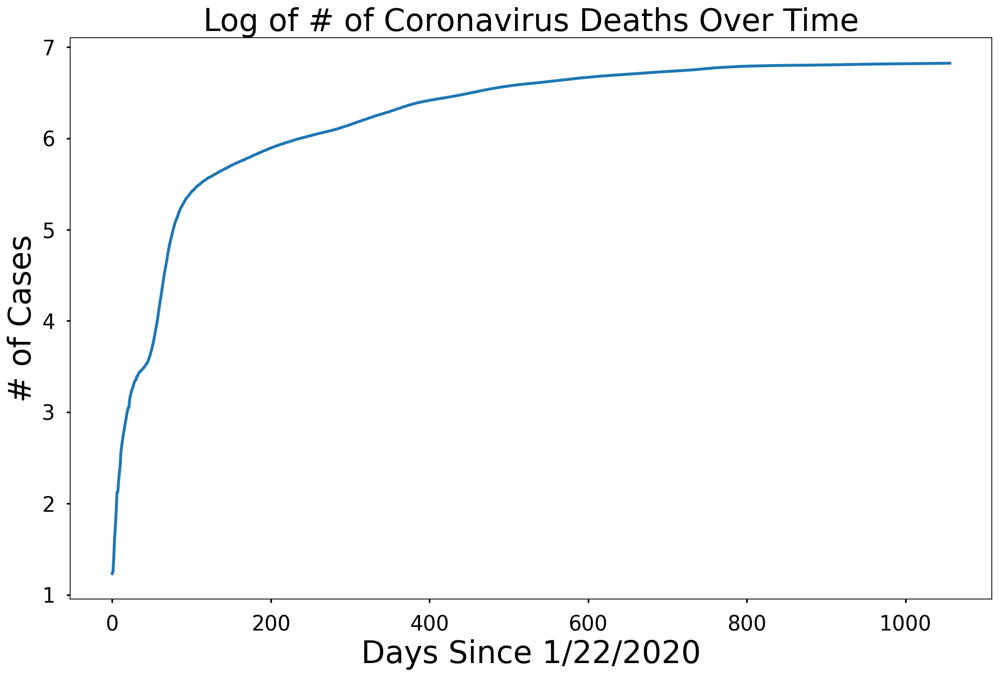

In [287]:
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(world_cases))
plt.title('Log of # of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, np.log10(total_deaths))
plt.title('Log of # of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

# plt.figure(figsize=(16, 10))
# plt.plot(adjusted_dates, np.log10(total_recovered))
# plt.title('Log of # of Coronavirus Recoveries Over Time', size=30)
# plt.xlabel('Days Since 1/22/2020', size=30)
# plt.ylabel('# of Cases', size=30)
# plt.xticks(size=20)
# plt.yticks(size=20)
# plt.show()

In [288]:
def country_plot(x, y1, y2, y3, country):
    # window is set as 14 in in the beginning of the notebook 
    confirmed_avg = moving_average(y1, window)
    confirmed_increase_avg = moving_average(y2, window)
    death_increase_avg = moving_average(y3, window)
    SIZE = (12, 8)
    
    plt.figure(figsize=SIZE)
    plt.plot(x, y1)
    plt.plot(x, confirmed_avg, color='red', linestyle='dashed')
    plt.legend(['{} Confirmed Cases'.format(country), 'Moving Average {} Days'.format(window)], prop={'size': 20})
    plt.title('{} Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=SIZE)
    plt.bar(x, y2)
    plt.plot(x, confirmed_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Cases'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Confirmed Cases'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

    plt.figure(figsize=SIZE)
    plt.bar(x, y3)
    plt.plot(x, death_increase_avg, color='red', linestyle='dashed')
    plt.legend(['Moving Average {} Days'.format(window), '{} Daily Increase in Confirmed Deaths'.format(country)], prop={'size': 20})
    plt.title('{} Daily Increases in Deaths'.format(country), size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()


# helper function for getting a country's total covid cases and deaths    
def get_country_info(country_name):
    country_cases = []
    country_deaths = []
    
    for i in range(num_dates):
        country_cases.append(confirmed_df[confirmed_df['Country/Region']==country_name][ck[i]].sum())
        country_deaths.append(deaths_df[deaths_df['Country/Region']==country_name][dk[i]].sum())
    return (country_cases, country_deaths)
    
    
def country_visualizations(country_name):
    country_info = get_country_info(country_name)
    country_cases = country_info[0]
    country_deaths = country_info[1]
    
    country_daily_increase = daily_increase(country_cases)
    country_daily_death = daily_increase(country_deaths)
    
    country_plot(adjusted_dates, country_cases, country_daily_increase, country_daily_death, country_name)
    

# Gráficos específicos del país
A diferencia de la sección anterior, estamos echando un vistazo a países específicos. Esto nos permite examinar covid a un nivel más localizado. Siéntase libre de cambiar/editar esta lista para visualizar los países de su elección.
<a id='gráficos_país'></a>

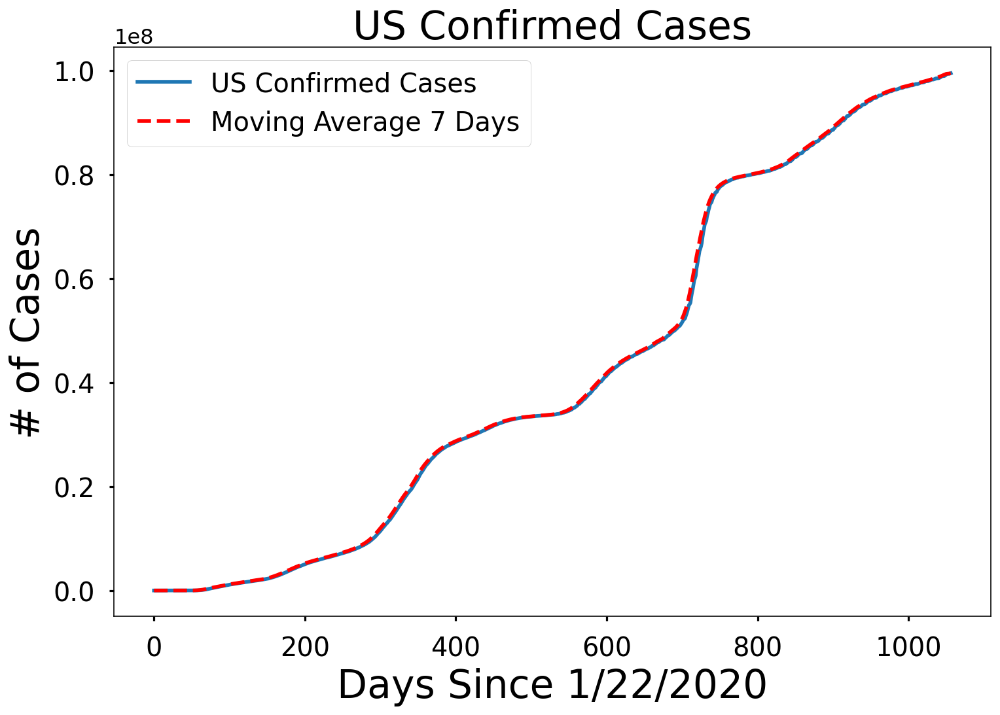

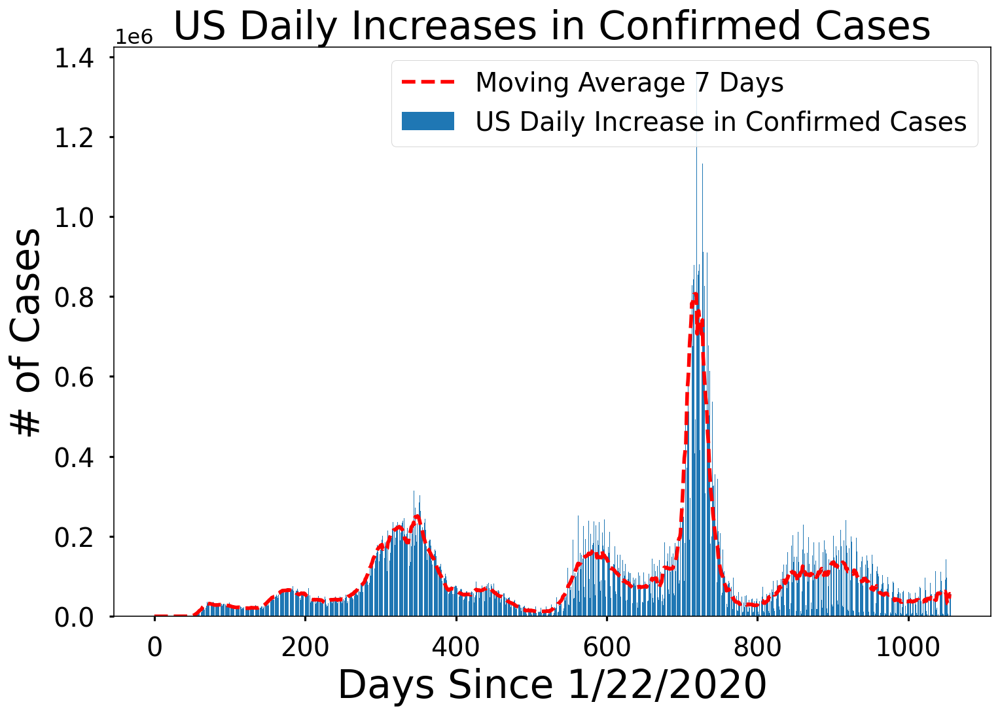

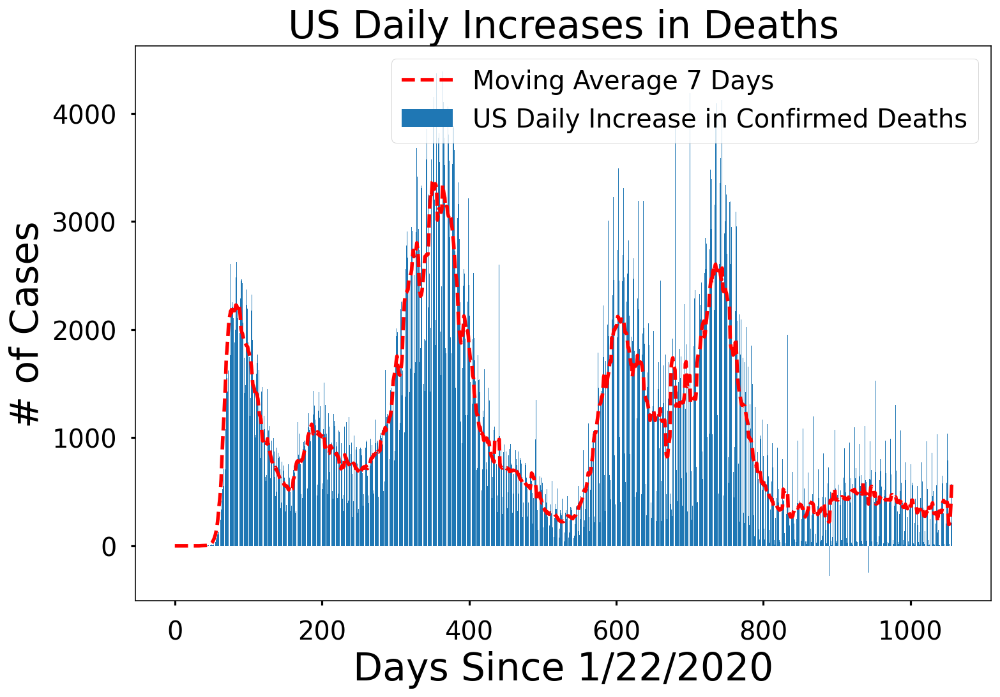

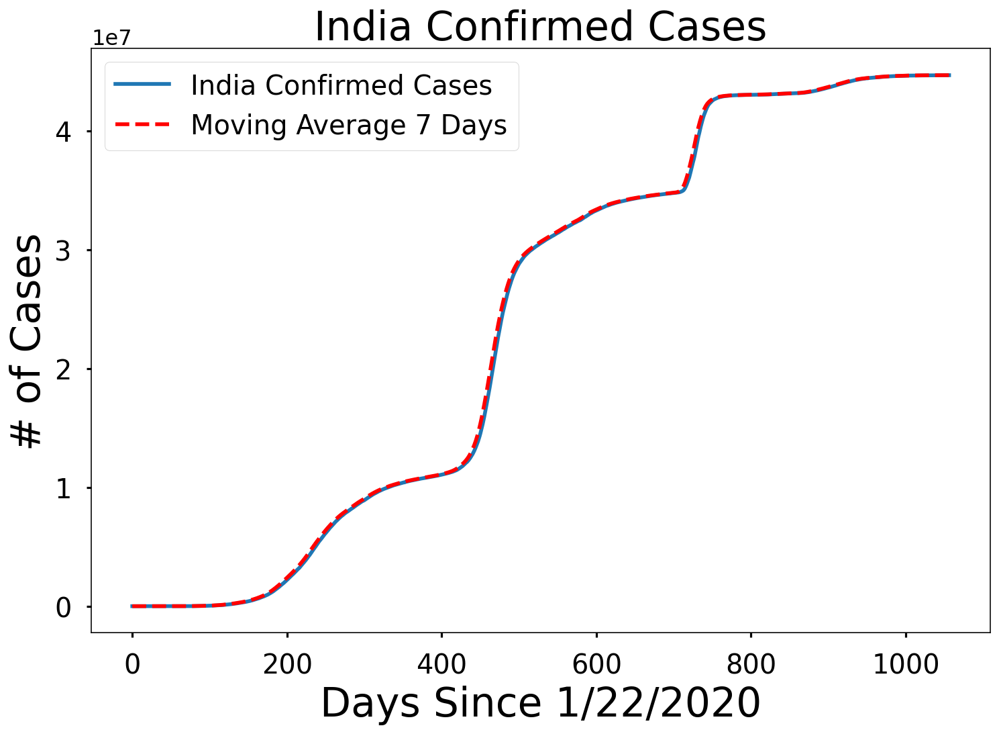

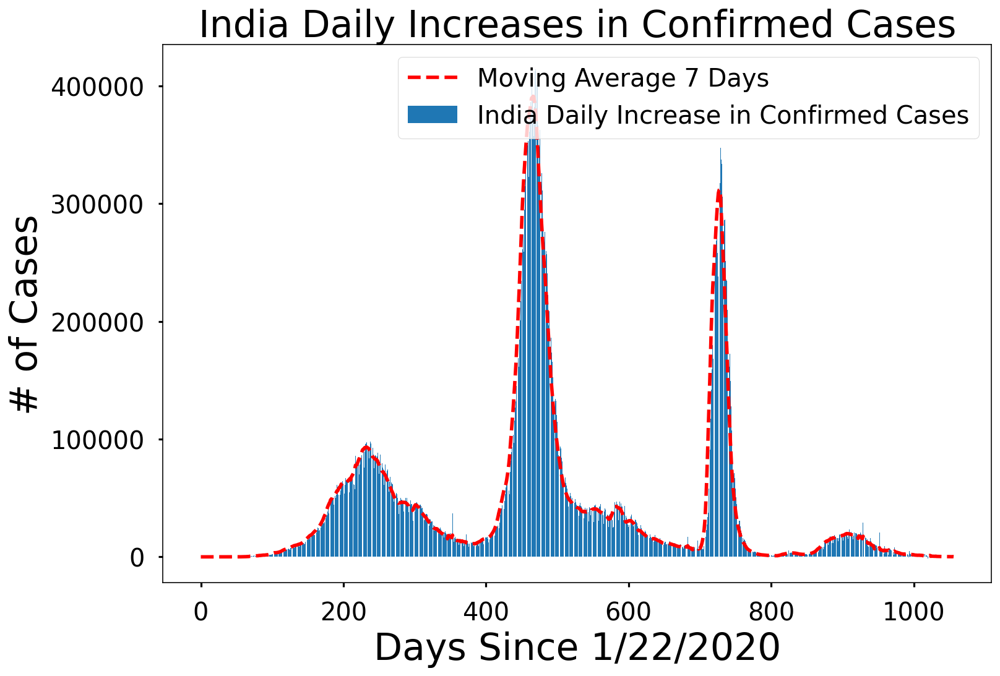

...

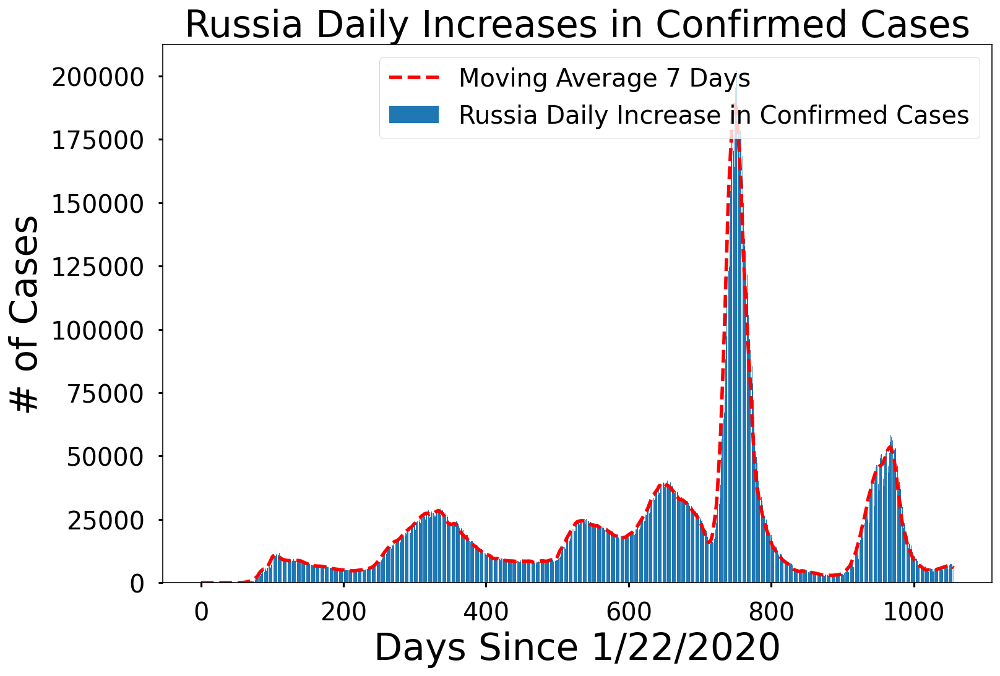

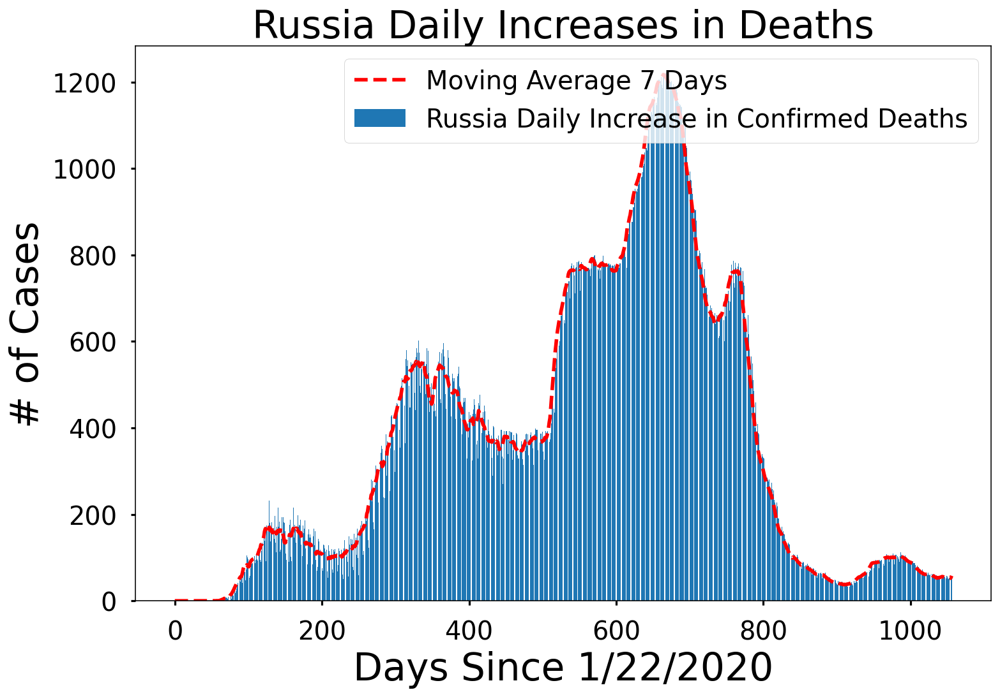

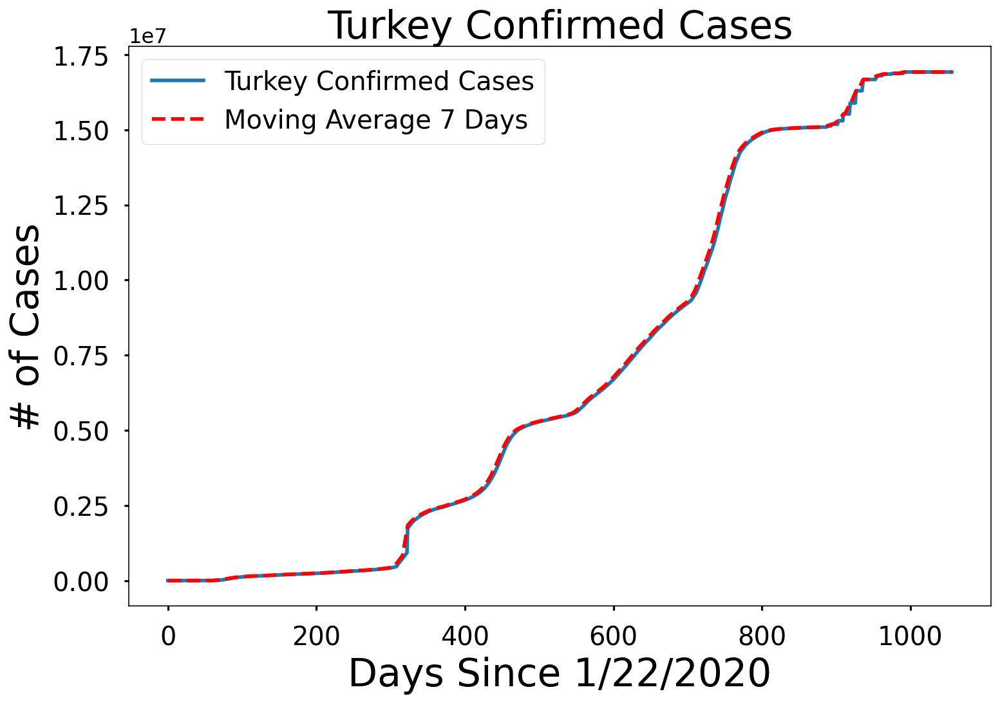

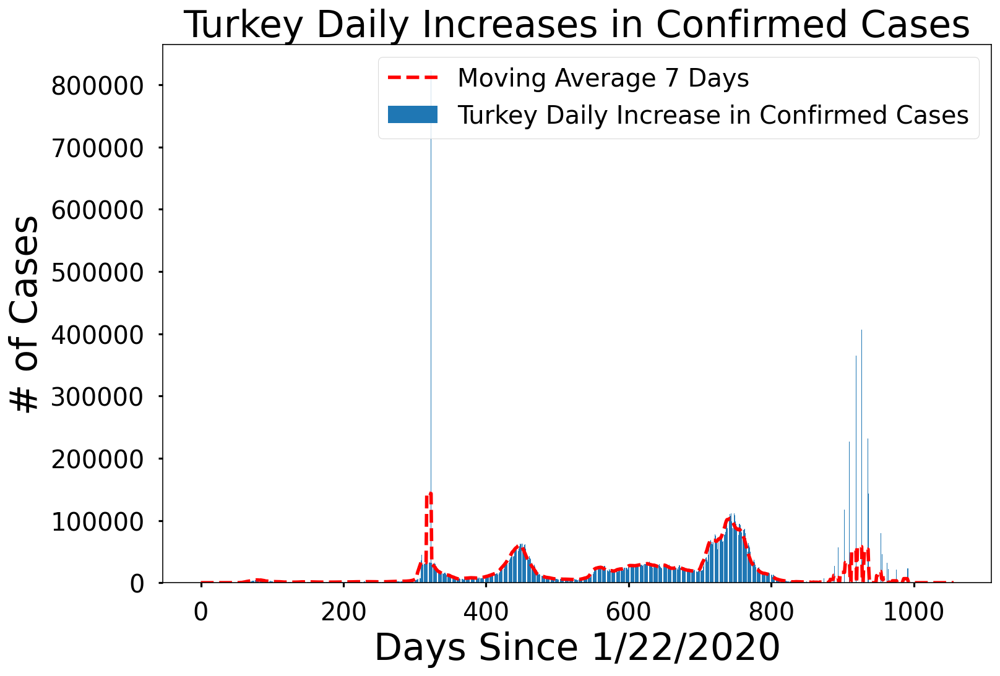

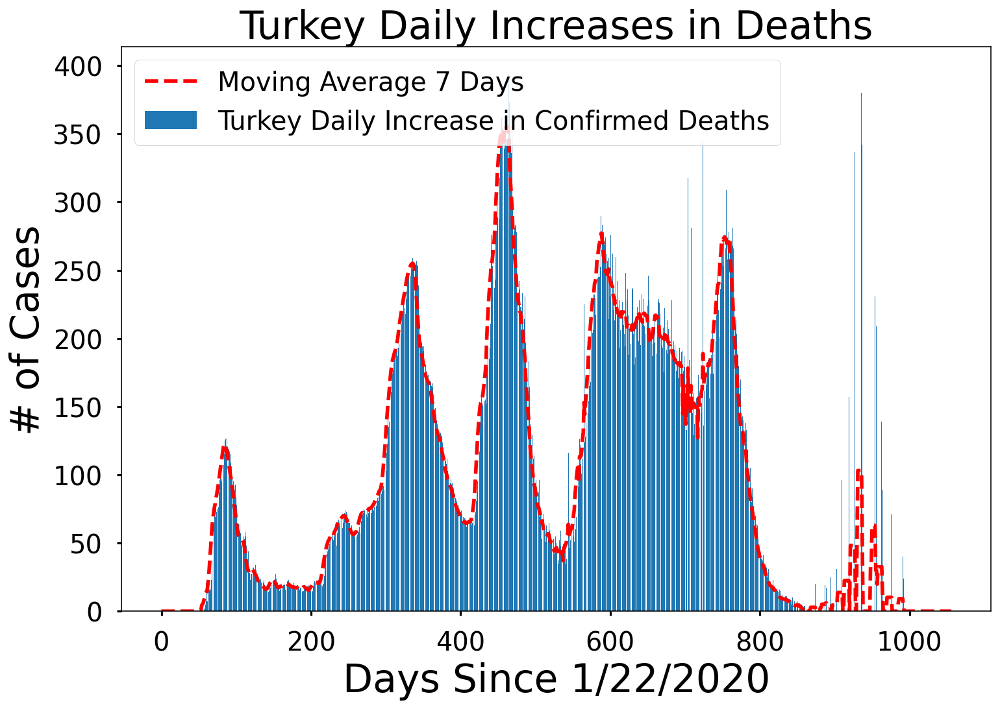

In [289]:
# top 10 total covid cases as of 7/13/2022
countries = ['US', 'India', 'Brazil', 'France', 'Germany', 'United Kingdom', 'Italy', 'Korea, South',
             'Russia', 'Turkey']

for country in countries:
    country_visualizations(country)

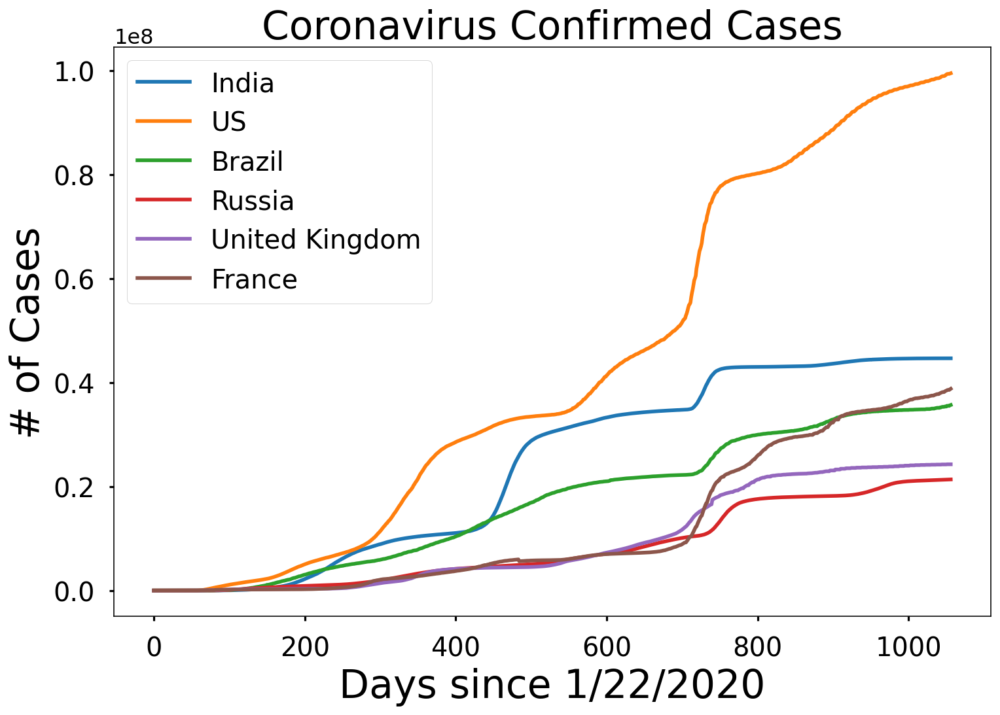

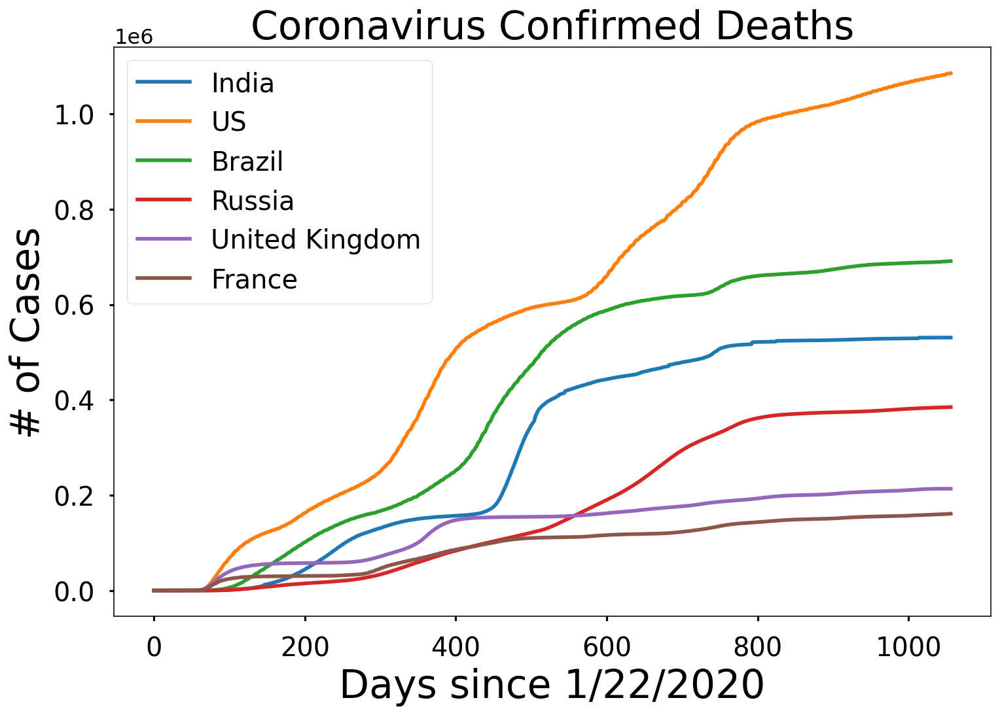

In [290]:

# Comparación de países
# código redundante eliminado

compare_countries = ['India', 'US', 'Brazil', 'Russia', 'United Kingdom', 'France'] 
graph_name = ['Coronavirus Confirmed Cases', 'Coronavirus Confirmed Deaths']

for num in range(2):
    plt.figure(figsize=(12, 8))
    for country in compare_countries:
        plt.plot(get_country_info(country)[num])
    plt.legend(compare_countries, prop={'size': 20})
    plt.xlabel('Days since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.title(graph_name[num], size=30)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

In [291]:
def plot_predictions(x, y, pred, algo_name, color):
    plt.figure(figsize=(12, 8))
    plt.plot(x, y)
    plt.plot(future_forcast, pred, linestyle='dashed', color=color)
    plt.title('Worldwide Coronavirus Cases Over Time', size=30)
    plt.xlabel('Days Since 1/22/2020', size=30)
    plt.ylabel('# of Cases', size=30)
    plt.legend(['Confirmed Cases', algo_name], prop={'size': 20})
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()

# Predicciones para casos confirmados de coronavirus en todo el mundo
Estos tres modelos predicen futuros casos de covid a nivel global.

Los modelos de predicción incluyen
* Máquinas de vectores soporte
* Regresión polinomial
* Regresión de cresta bayesiana

<a id='predicción'></a>

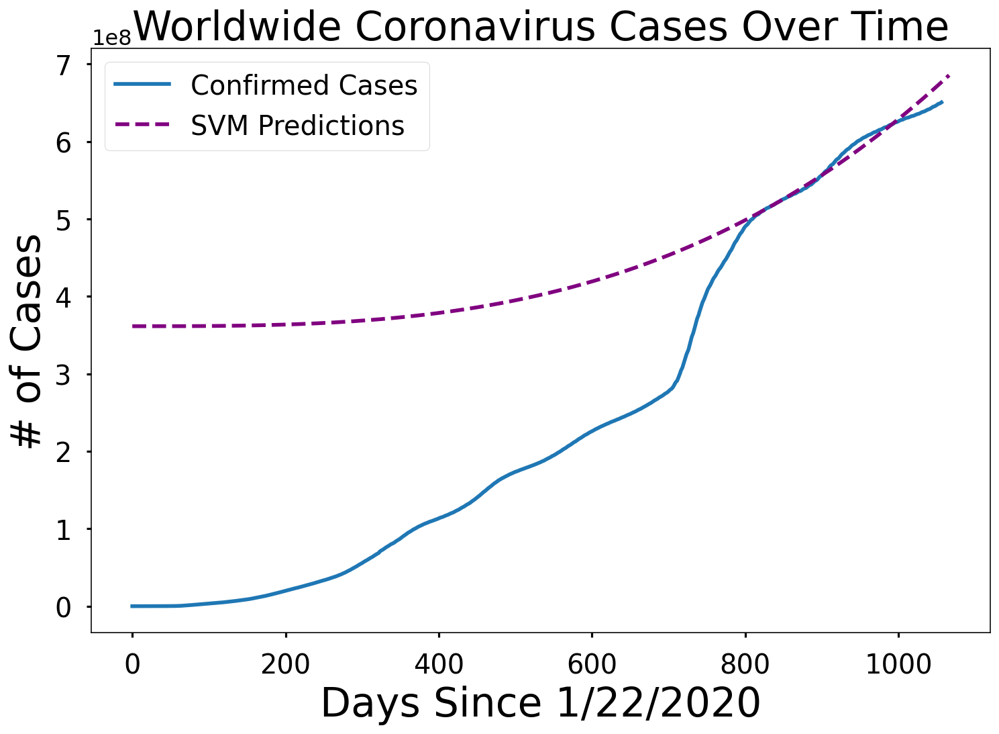

In [292]:
plot_predictions(adjusted_dates, world_cases, svm_pred, 'SVM Predictions', 'purple')

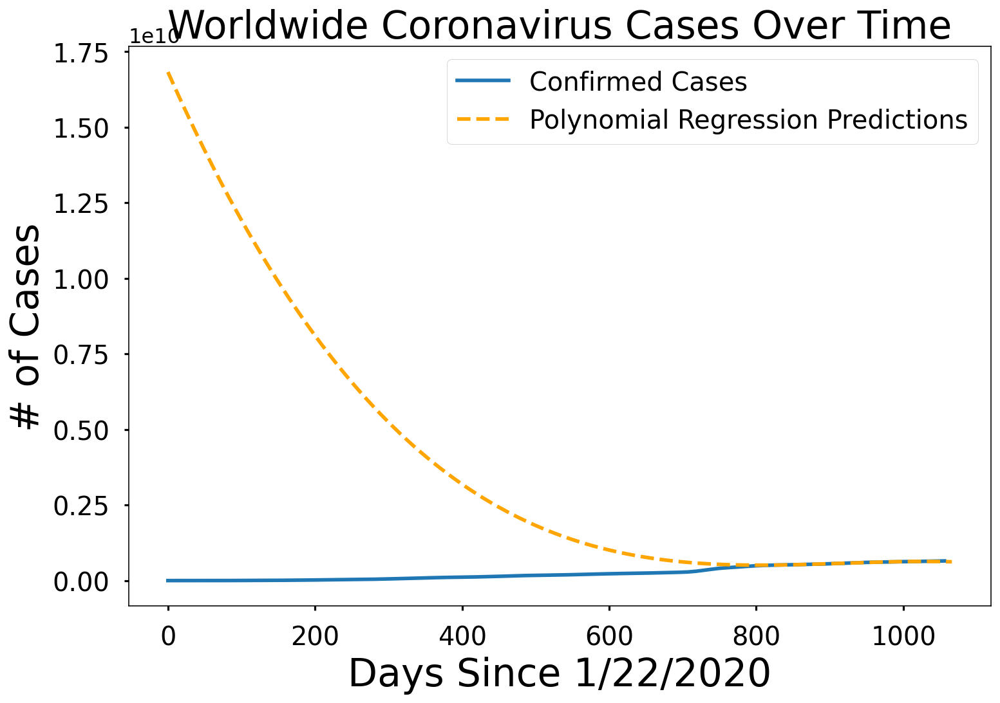

In [293]:
plot_predictions(adjusted_dates, world_cases, linear_pred, 'Polynomial Regression Predictions', 'orange')

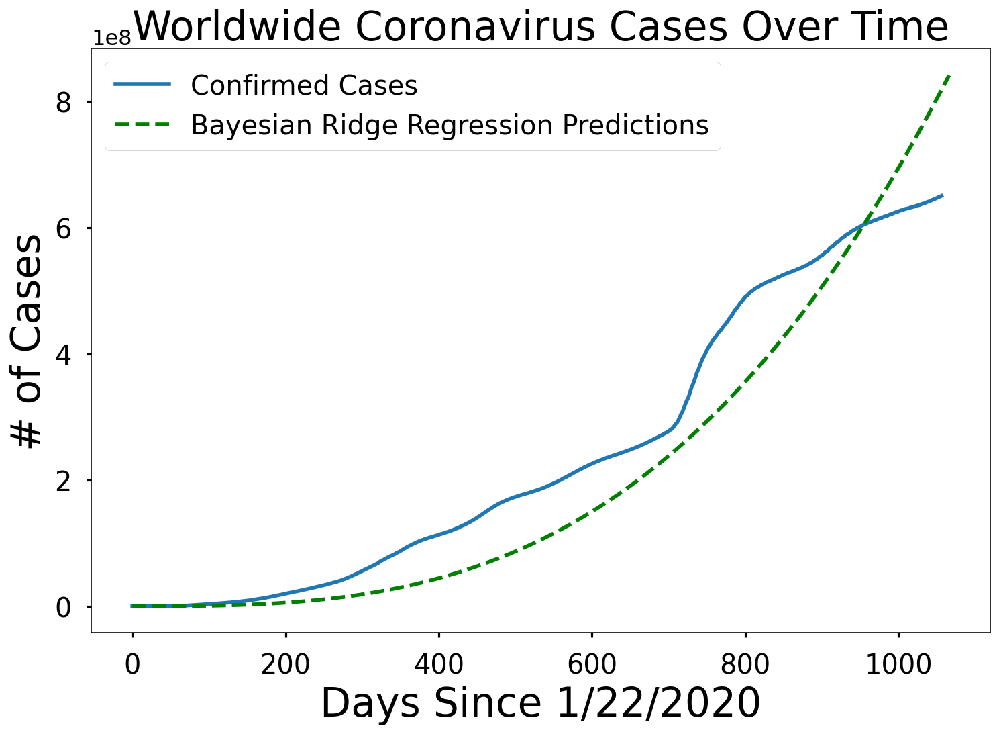

In [294]:
plot_predictions(adjusted_dates, world_cases, bayesian_pred, 'Bayesian Ridge Regression Predictions', 'green')

In [335]:
# Predicciones futuras usando SVM
svm_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'SVM Predicted # of Confirmed Cases Worldwide': np.round(svm_pred[-10:])})
svm_df.style.background_gradient(cmap='Reds')

,Date,SVM Predicted # of Confirmed Cases Worldwide
0,12/14/2022,677365134.000000
1,12/15/2022,678262637.000000
2,12/16/2022,679161838.000000
3,12/17/2022,680062739.000000
4,12/18/2022,680965341.000000
5,12/19/2022,681869647.000000
6,12/20/2022,682775657.000000
7,12/21/2022,683683373.000000
8,12/22/2022,684592797.000000
9,12/23/2022,685503931.000000


In [336]:

# Predicciones futuras usando regresión polinomial
linear_pred = linear_pred.reshape(1,-1)[0]
linear_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Polynomial Predicted # of Confirmed Cases Worldwide': np.round(linear_pred[-10:])})
linear_df.style.background_gradient(cmap='Reds')

,Date,Polynomial Predicted # of Confirmed Cases Worldwide
0,12/14/2022,626871331.000000
1,12/15/2022,626374020.000000
2,12/16/2022,625857901.000000
3,12/17/2022,625322842.000000
4,12/18/2022,624768709.000000
5,12/19/2022,624195370.000000
6,12/20/2022,623602692.000000
7,12/21/2022,622990543.000000
8,12/22/2022,622358790.000000
9,12/23/2022,621707300.000000


In [297]:

# Predicciones futuras usando Bayesian Ridge
bayesian_df = pd.DataFrame({'Date': future_forcast_dates[-10:], 'Bayesian Ridge Predicted # of Confirmed Cases Worldwide': np.round(bayesian_pred[-10:])})
bayesian_df.style.background_gradient(cmap='Reds')

,Date,Bayesian Ridge Predicted # of Confirmed Cases Worldwide
0,12/14/2022,820761996.000000
1,12/15/2022,823093622.000000
2,12/16/2022,825429661.000000
3,12/17/2022,827770115.000000
4,12/18/2022,830114989.000000
5,12/19/2022,832464287.000000
6,12/20/2022,834818014.000000
7,12/21/2022,837176173.000000
8,12/22/2022,839538768.000000
9,12/23/2022,841905805.000000


Tasa de mortalidad (mundial) 

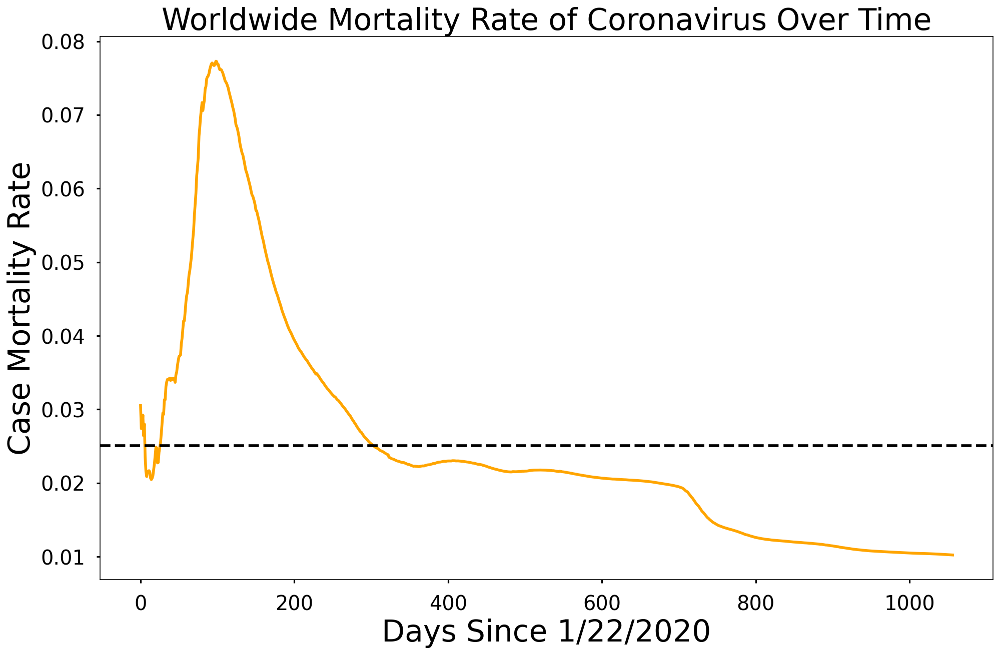

In [298]:
mean_mortality_rate = np.mean(mortality_rate)
plt.figure(figsize=(16, 10))
plt.plot(adjusted_dates, mortality_rate, color='orange')
plt.axhline(y = mean_mortality_rate,linestyle='--', color='black')
plt.title('Worldwide Mortality Rate of Coronavirus Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('Case Mortality Rate', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [299]:
unique_countries =  list(latest_data['Country_Region'].unique())

In [300]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
country_incidence_rate = [] 
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    

# ordenar países por el número de casos confirmados
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_incidence_rate.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Incident_Rate'].sum())
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])

# Tabla de datos
<a id='tabla_datos'></a>
Esto muestra datos de covid para varios países. La tabla incluye el número de casos confirmados, muertes, tasa de incidencia y tasa de mortalidad.

In [301]:
country_df = pd.DataFrame({'Country Name': unique_countries, 'Number of Confirmed Cases': [format(int(i), ',d') for i in country_confirmed_cases],
                          'Number of Deaths': [format(int(i), ',d') for i in country_death_cases], 
                          'Incidence Rate' : country_incidence_rate,
                          'Mortality Rate': country_mortality_rate})

# número de casos por país/región

country_df.style.background_gradient(cmap='Oranges')

,Country Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,US,"94,069,162","1,043,389",88820635.644683,0.011092
1,India,"44,389,176","527,556",200544.270471,0.011885
2,France,"34,644,718","154,846",447832.222086,0.004470
3,Brazil,"34,350,639","683,233",496450.854800,0.019890
4,Germany,"32,008,122","147,003",602444.503590,0.004593
5,United Kingdom,"23,708,470","207,331",562595.162573,0.008745
6,"Korea, South","22,802,985","26,413",44476.981426,0.001158
7,Italy,"21,745,065","175,127",758220.990706,0.008054
8,Russia,"18,985,174","376,052",1075253.059789,0.019808
9,Japan,"18,018,770","38,248",581541.528681,0.002123


In [302]:
unique_provinces =  list(latest_data['Province_State'].unique())


Obtener la información más reciente sobre **provincias/estados** que tienen casos confirmados de coronavirus

In [303]:
province_confirmed_cases = []
province_country = [] 
province_death_cases = [] 
province_incidence_rate = []
province_mortality_rate = [] 

no_cases = [] 
for i in unique_provinces:
    cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
    if cases > 0:
        province_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
 
# remove areas with no confirmed cases
for i in no_cases:
    unique_provinces.remove(i)
    
unique_provinces = [k for k, v in sorted(zip(unique_provinces, province_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_provinces)):
    province_confirmed_cases[i] = latest_data[latest_data['Province_State']==unique_provinces[i]]['Confirmed'].sum()
    province_country.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Country_Region'].unique()[0])
    province_death_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Deaths'].sum())
#     province_recovery_cases.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Recovered'].sum())
#     province_active.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Active'].sum())
    province_incidence_rate.append(latest_data[latest_data['Province_State']==unique_provinces[i]]['Incident_Rate'].sum())
    province_mortality_rate.append(province_death_cases[i]/province_confirmed_cases[i])

In [304]:
# nan_indices = [] 

# # handle nan if there is any, it is usually a float: float('nan')

# for i in range(len(unique_provinces)):
#     if type(unique_provinces[i]) == float:
#         nan_indices.append(i)

# unique_provinces = list(unique_provinces)
# province_confirmed_cases = list(province_confirmed_cases)

# for i in nan_indices:
#     unique_provinces.pop(i)
#     province_confirmed_cases.pop(i)

In [305]:

# número de casos por provincia/estado/ciudad top 100
province_limit = 100 
province_df = pd.DataFrame({'Province/State Name': unique_provinces[:province_limit], 'Country': province_country[:province_limit], 'Number of Confirmed Cases': [format(int(i), ',d') for i in province_confirmed_cases[:province_limit]],
                          'Number of Deaths': [format(int(i), ',d') for i in province_death_cases[:province_limit]], 
                        'Incidence Rate' : province_incidence_rate[:province_limit], 'Mortality Rate': province_mortality_rate[:province_limit]})
# number of cases per country/region

province_df.style.background_gradient(cmap='Oranges')

,Province/State Name,Country,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,England,United Kingdom,"19,808,426","175,115",35386.596686,0.008840
1,California,US,"11,053,961","94,644",1437886.537764,0.008562
2,Maharashtra,India,"8,091,276","148,214",6570.568885,0.018318
3,Texas,US,"7,791,620","90,052",6694883.209554,0.011558
4,Florida,US,"6,991,770","79,450",1971657.530314,0.011363
5,Kerala,India,"6,748,557","70,759",18903.815950,0.010485
6,Nordrhein-Westfalen,Germany,"6,548,582","26,942",36517.645941,0.004114
7,Sao Paulo,Brazil,"6,013,105","174,019",13095.012050,0.028940
8,New York,US,"5,963,876","70,995",1574249.051190,0.011904
9,Bayern,Germany,"5,819,433","25,369",44502.234161,0.004359


In [306]:

# devolver la tabla de datos con información de provincia/estado para un país dado
def country_table(country_name):
    states = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    state_confirmed_cases = []
    state_death_cases = [] 
    # state_recovery_cases = []
#     state_active = [] 
    state_incidence_rate = [] 
    state_mortality_rate = [] 

    no_cases = [] 
    for i in states:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            state_confirmed_cases.append(cases)
        else:
            no_cases.append(i)

# eliminar áreas sin casos confirmados
    for i in no_cases:
        states.remove(i)

    states = [k for k, v in sorted(zip(states, state_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
    for i in range(len(states)):
        state_confirmed_cases[i] = latest_data[latest_data['Province_State']==states[i]]['Confirmed'].sum()
        state_death_cases.append(latest_data[latest_data['Province_State']==states[i]]['Deaths'].sum())
    #     state_recovery_cases.append(latest_data[latest_data['Province_State']==states[i]]['Recovered'].sum())
#         state_active.append(latest_data[latest_data['Province_State']==states[i]]['Active'].sum())
        state_incidence_rate.append(latest_data[latest_data['Province_State']==states[i]]['Incident_Rate'].sum())
        state_mortality_rate.append(state_death_cases[i]/state_confirmed_cases[i])
        
      
    state_df = pd.DataFrame({'State Name': states, 'Number of Confirmed Cases': [format(int(i), ',d') for i in state_confirmed_cases],
                              'Number of Deaths': [format(int(i), ',d') for i in state_death_cases], 
                             'Incidence Rate' : state_incidence_rate, 'Mortality Rate': state_mortality_rate})

# número de casos por país/región
    return state_df

Data table for the **United States**

In [307]:
us_table = country_table('US')
us_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,California,"11,053,961","94,644",1437886.537764,0.008562
1,Texas,"7,791,620","90,052",6694883.209554,0.011558
2,Florida,"6,991,770","79,450",1971657.530314,0.011363
3,New York,"5,963,876","70,995",1574249.051190,0.011904
4,Illinois,"3,666,458","39,265",3319543.524727,0.010709
5,Pennsylvania,"3,167,638","46,596",1694298.447048,0.014710
6,North Carolina,"3,098,923","25,843",2885376.985003,0.008339
7,Ohio,"3,049,546","39,685",2346758.131259,0.013013
8,Georgia,"2,852,706","39,632",4125521.395183,0.013893
9,Michigan,"2,751,201","37,909",2075011.176514,0.013779


Data table for **India**

In [308]:
india_table = country_table('India')
india_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Maharashtra,"8,091,276","148,214",6570.568885,0.018318
1,Kerala,"6,748,557","70,759",18903.815950,0.010485
2,Karnataka,"4,046,105","40,224",5988.668064,0.009941
3,Tamil Nadu,"3,565,562","38,034",4580.554939,0.010667
4,Andhra Pradesh,"2,336,386","14,733",4334.395054,0.006306
5,Uttar Pradesh,"2,120,843","23,600",891.549817,0.011128
6,West Bengal,"2,105,787","21,451",2114.046516,0.010187
7,Delhi,"1,997,054","26,446",10673.199322,0.013243
8,Odisha,"1,326,121","9,168",2860.711548,0.006913
9,Rajasthan,"1,306,844","9,620",1612.736806,0.007361


Data table for **Brazil**

In [309]:
brazil_table = country_table('Brazil')
brazil_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Sao Paulo,"6,013,105","174,019",13095.012050,0.028940
1,Minas Gerais,"3,867,474","63,465",18269.697122,0.016410
2,Parana,"2,729,490","45,076",23871.788218,0.016514
3,Rio Grande do Sul,"2,702,578","40,801",23754.251800,0.015097
4,Rio de Janeiro,"2,480,042","75,351",14364.611572,0.030383
5,Santa Catarina,"1,859,669","22,342",25955.673776,0.012014
6,Bahia,"1,683,395","30,617",11318.414282,0.018188
7,Goias,"1,670,745","27,434",23805.368039,0.016420
8,Ceara,"1,379,242","27,541",15103.265653,0.019968
9,Espirito Santo,"1,213,570","14,777",30198.449728,0.012176


Data table for **Russia**

In [310]:
russia_table = country_table('Russia')
russia_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Moscow,"2,990,057","44,955",23908.085000,0.015035
1,Saint Petersburg,"1,634,921","34,609",30548.222278,0.021169
2,Moscow Oblast,"1,043,721","15,256",13910.001952,0.014617
3,Sverdlovsk Oblast,"463,613","10,799",10718.741272,0.023293
4,Nizhny Novgorod Oblast,"436,657","11,619",13498.932839,0.026609
5,Voronezh Oblast,"403,864","8,371",17305.233425,0.020727
6,Samara Oblast,"400,365","7,951",12536.816811,0.019859
7,Rostov Oblast,"395,776","10,972",9377.573776,0.027723
8,Perm Krai,"383,757","8,862",14629.780849,0.023093
9,Krasnoyarsk Krai,"380,087","10,935",13213.537160,0.028770


Data table for **United Kingdom**

In [311]:
uk_table = country_table('United Kingdom')
uk_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,England,"19,808,426","175,115",35386.596686,0.008840
1,Scotland,"2,087,616","15,597",38211.630333,0.007471
2,Unknown,"1,018,899","36,585",0.000000,0.035906
3,Wales,"883,539","10,753",28150.735997,0.012170
4,Northern Ireland,"713,294","4,835",37908.907313,0.006778
5,Jersey,"58,733",135,53735.590119,0.002299
6,Isle of Man,"38,008",116,44698.466460,0.003052
7,Guernsey,"30,651",62,48652.380952,0.002023
8,Cayman Islands,"30,057",29,45734.936093,0.000965
9,Gibraltar,"20,049",107,59508.474073,0.005337


Data table for **France**

In [312]:
france_table = country_table('France')
france_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Reunion,"454,665",855,50783.082470,0.001881
1,Martinique,"213,889","1,009",56996.788936,0.004717
2,Guadeloupe,"190,054",978,47498.419252,0.005146
3,French Guiana,"93,420",408,31277.412097,0.004367
4,French Polynesia,"76,415",649,27203.243813,0.008493
5,New Caledonia,"73,633",314,25791.706218,0.004264
6,Mayotte,"39,895",187,14623.569991,0.004687
7,St Martin,"11,857",63,30670.736439,0.005313
8,Saint Barthelemy,"5,208",6,52685.887709,0.001152
9,Saint Pierre and Miquelon,"3,131",1,54029.335634,0.000319


Data table for **Italy**

In [313]:
italy_table = country_table('Italy')
italy_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Lombardia,"3,456,021","42,154",34352.125435,0.012197
1,Veneto,"2,183,613","15,325",44510.354364,0.007018
2,Campania,"2,171,755","11,052",37433.131576,0.005089
3,Lazio,"2,009,161","11,959",34174.740206,0.005952
4,Emilia-Romagna,"1,812,352","17,849",40640.460754,0.009849
5,Sicilia,"1,612,060","12,035",32241.902873,0.007466
6,Puglia,"1,446,656","8,969",35905.608588,0.006200
7,Piemonte,"1,422,156","13,587",32645.166681,0.009554
8,Toscana,"1,371,148","10,626",36763.538367,0.007750
9,Marche,"600,626","4,087",39378.313755,0.006805


Data table for **Germany**

In [314]:
germany_table = country_table('Germany')
germany_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Nordrhein-Westfalen,"6,548,582","26,942",36517.645941,0.004114
1,Bayern,"5,819,433","25,369",44502.234161,0.004359
2,Baden-Wurttemberg,"4,374,080","16,893",39514.584762,0.003862
3,Niedersachsen,"3,078,042","10,418",38560.125916,0.003385
4,Hessen,"2,399,037","10,883",38287.745445,0.004536
5,Sachsen,"1,704,781","15,879",41804.986198,0.009314
6,Rheinland-Pfalz,"1,439,179","6,049",35232.165537,0.004203
7,Berlin,"1,223,516","4,753",33568.570900,0.003885
8,Unknown,"1,018,899","36,585",0.000000,0.035906
9,Schleswig-Holstein,"976,056","2,809",33695.306955,0.002878


Data table for **Spain**

In [315]:
spain_table = country_table('Spain')
spain_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Catalonia,"2,621,995","20,344",34652.995580,0.007759
1,Madrid,"1,912,985","19,072",28802.862060,0.009970
2,Andalusia,"1,574,914","14,325",18688.006569,0.009096
3,C. Valenciana,"1,541,004","9,921",30975.147785,0.006438
4,Unknown,"1,018,899","36,585",0.000000,0.035906
5,Castilla y Leon,"814,855","9,101",33843.245908,0.011169
6,Pais Vasco,"768,984","7,114",35308.832443,0.009251
7,Galicia,"723,555","3,863",26793.956987,0.005339
8,Castilla - La Mancha,"584,295","7,767",28714.020553,0.013293
9,Aragon,"455,529","5,160",34494.459278,0.011327


Data table for **China**

In [316]:
china_table = country_table('China')
china_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Hong Kong,"1,487,972","9,643",19847.597462,0.006481
1,Unknown,"1,018,899","36,585",0.000000,0.035906
2,Hubei,"68,421","4,512",115.634612,0.065945
3,Shanghai,"63,803",595,263.213696,0.009326
4,Jilin,"40,309",5,149.071746,0.000124
5,Guangdong,"8,823",8,7.776309,0.000907
6,Hainan,"8,499",6,90.995717,0.000706
7,Fujian,"4,021",1,10.202994,0.000249
8,Beijing,"3,956",9,18.365831,0.002275
9,Shaanxi,"3,630",3,9.394410,0.000826


Data table for **Mexico**

In [317]:
mexico_table = country_table('Mexico')
mexico_table.style.background_gradient(cmap='Oranges')

,State Name,Number of Confirmed Cases,Number of Deaths,Incidence Rate,Mortality Rate
0,Ciudad de Mexico,"1,719,273","43,470",19063.540033,0.025284
1,Unknown,"1,018,899","36,585",0.000000,0.035906
2,Mexico,"693,713","47,782",3980.498962,0.068879
3,Nuevo Leon,"396,127","15,307",7060.894774,0.038642
4,Guanajuato,"348,698","15,043",5598.718726,0.043140
5,Jalisco,"280,510","19,927",3335.555769,0.071038
6,San Luis Potosi,"233,997","7,587",8164.180281,0.032423
7,Veracruz,"221,690","16,981",2595.943588,0.076598
8,Tabasco,"212,908","6,122",8276.992420,0.028754
9,Puebla,"206,149","16,629",3121.364668,0.080665


<a id='bar_charts'></a>
# Visualizaciones de gráficos de barras para COVID-19
Esto nos ofrece algunas ideas sobre cómo se comparan los diferentes países/regiones en términos de casos de covid.

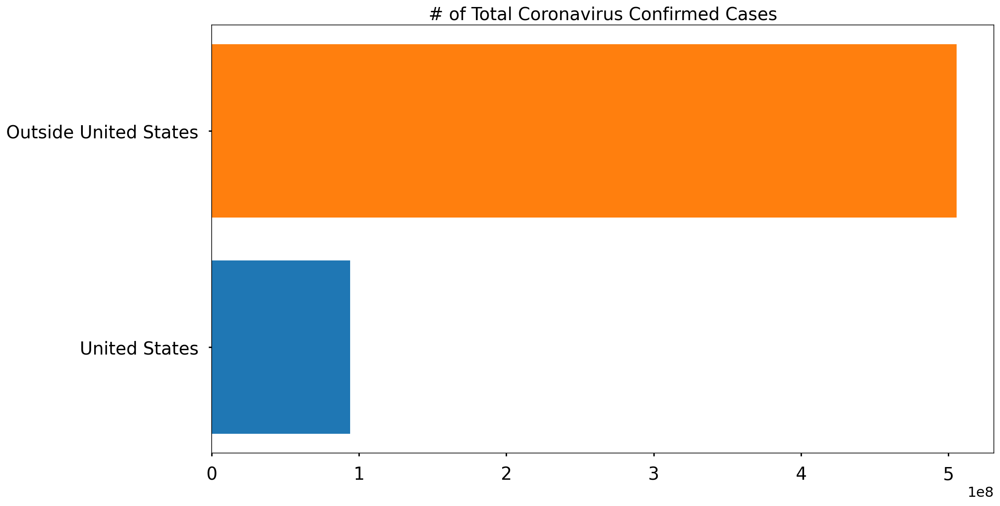

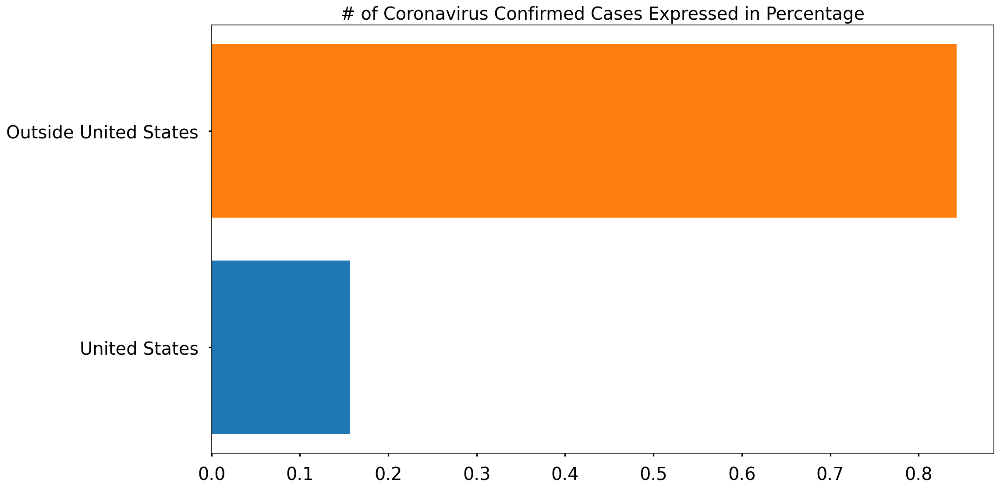

In [318]:
total_world_cases = np.sum(country_confirmed_cases)
us_confirmed = latest_data[latest_data['Country_Region']=='US']['Confirmed'].sum()
outside_us_confirmed = total_world_cases - us_confirmed

plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed)
plt.barh('Outside United States', outside_us_confirmed)
plt.title('# of Total Coronavirus Confirmed Cases', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


plt.figure(figsize=(16, 9))
plt.barh('United States', us_confirmed/total_world_cases)
plt.barh('Outside United States', outside_us_confirmed/total_world_cases)
plt.title('# of Coronavirus Confirmed Cases Expressed in Percentage', size=20)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

In [319]:
print('Outside United States {} cases ({}%):'.format(outside_us_confirmed, np.round((outside_us_confirmed/total_world_cases)*100, 1)))
print('United States {} cases ({}%)'.format(us_confirmed, np.round((us_confirmed/total_world_cases)*100, 1)))
print('Total: {} cases'.format(total_world_cases))

Outside United States 505685603 cases (84.3%):
United States 94069162 cases (15.7%)
Total: 599754765 cases


In [320]:
# Solo muestra 10 países con más casos confirmados, el resto se agrupan en la otra categoría
visual_unique_countries = [] 
visual_confirmed_cases = []
others = np.sum(country_confirmed_cases[10:])

for i in range(len(country_confirmed_cases[:10])):
    visual_unique_countries.append(unique_countries[i])
    visual_confirmed_cases.append(country_confirmed_cases[i])
    
visual_unique_countries.append('Others')
visual_confirmed_cases.append(others)

In [321]:
def plot_bar_graphs(x, y, title):
    plt.figure(figsize=(16, 12))
    plt.barh(x, y)
    plt.title(title, size=20)
    plt.xticks(size=20)
    plt.yticks(size=20)
    plt.show()
    

def plot_bar_graphs_tall(x, y, title):
    plt.figure(figsize=(19, 18))
    plt.barh(x, y)
    plt.title(title, size=25)
    plt.xticks(size=25)
    plt.yticks(size=25)
    plt.show()

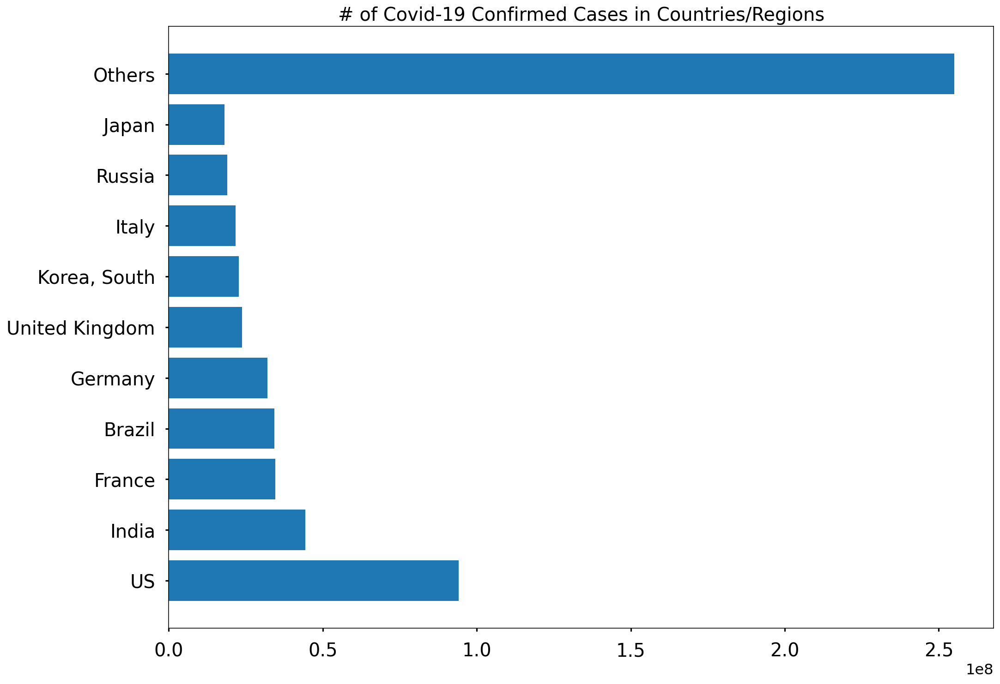

In [322]:
plot_bar_graphs(visual_unique_countries, visual_confirmed_cases, '# of Covid-19 Confirmed Cases in Countries/Regions')

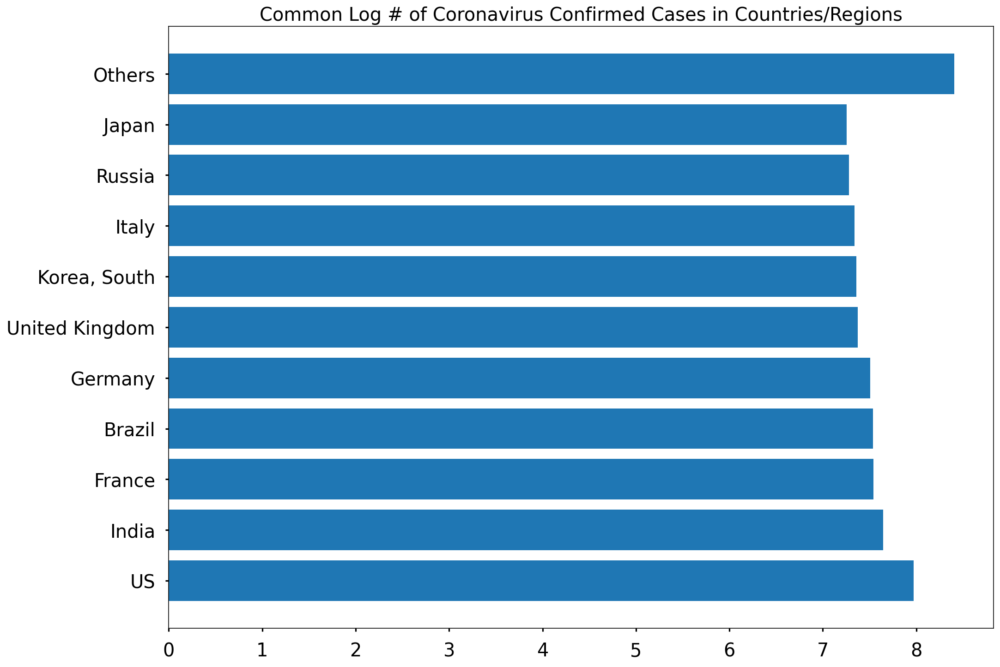

In [323]:
log_country_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases]
plot_bar_graphs(visual_unique_countries, log_country_confirmed_cases, 'Common Log # of Coronavirus Confirmed Cases in Countries/Regions')

In [324]:

# Solo muestra 10 provincias con más casos confirmados, el resto se agrupan en la otra categoría
visual_unique_provinces = [] 
visual_confirmed_cases2 = []
others = np.sum(province_confirmed_cases[10:])
for i in range(len(province_confirmed_cases[:10])):
    visual_unique_provinces.append(unique_provinces[i])
    visual_confirmed_cases2.append(province_confirmed_cases[i])

visual_unique_provinces.append('Others')
visual_confirmed_cases2.append(others)

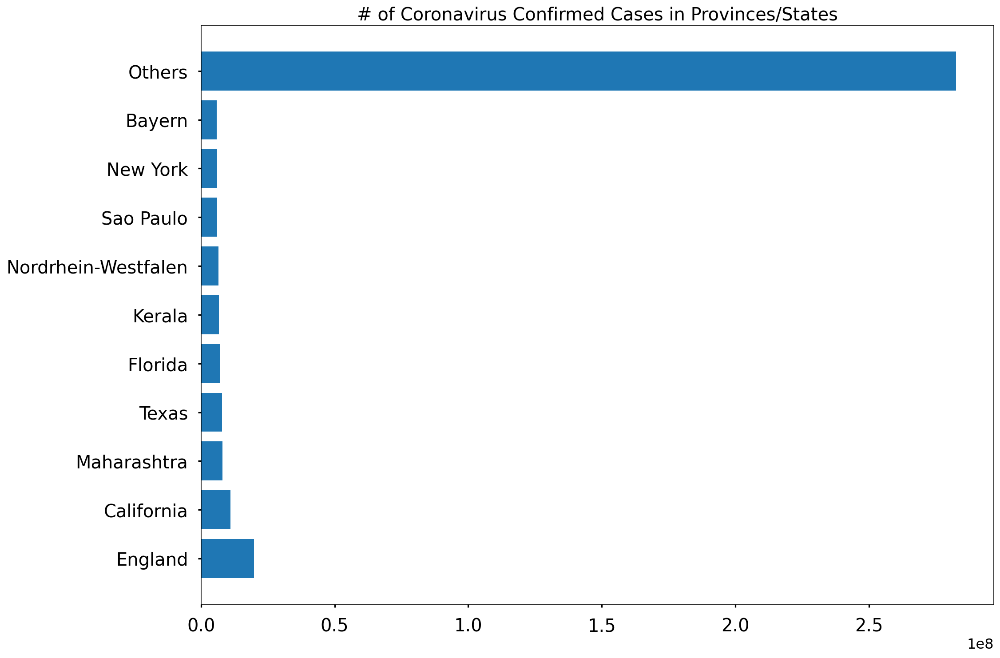

In [325]:
plot_bar_graphs(visual_unique_provinces, visual_confirmed_cases2, '# of Coronavirus Confirmed Cases in Provinces/States')

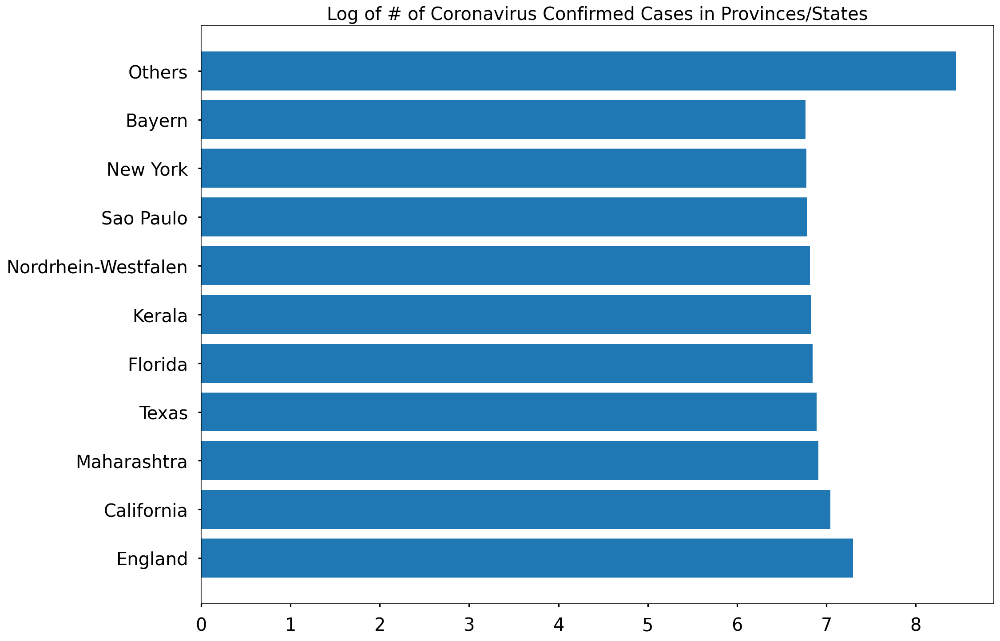

In [326]:
log_province_confirmed_cases = [math.log10(i) for i in visual_confirmed_cases2]
plot_bar_graphs(visual_unique_provinces, log_province_confirmed_cases, 'Log of # of Coronavirus Confirmed Cases in Provinces/States')

<a id='gráficos circulares'></a>
# Visualizaciones de gráficos circulares para COVID-19
Aunque los gráficos circulares no son necesariamente las visualizaciones más informativas, los agregué para aumentar la variedad de visualizaciones.

In [327]:
def plot_pie_charts(x, y, title):
  
    c = ['lightcoral', 'rosybrown', 'sandybrown', 'navajowhite', 'gold',
        'khaki', 'lightskyblue', 'turquoise', 'lightslategrey', 'thistle', 'pink']
    plt.figure(figsize=(20,15))
    plt.title(title, size=20)
    plt.pie(y, colors=c,shadow=True)
    plt.legend(x, loc='best', fontsize=12)
    plt.show()

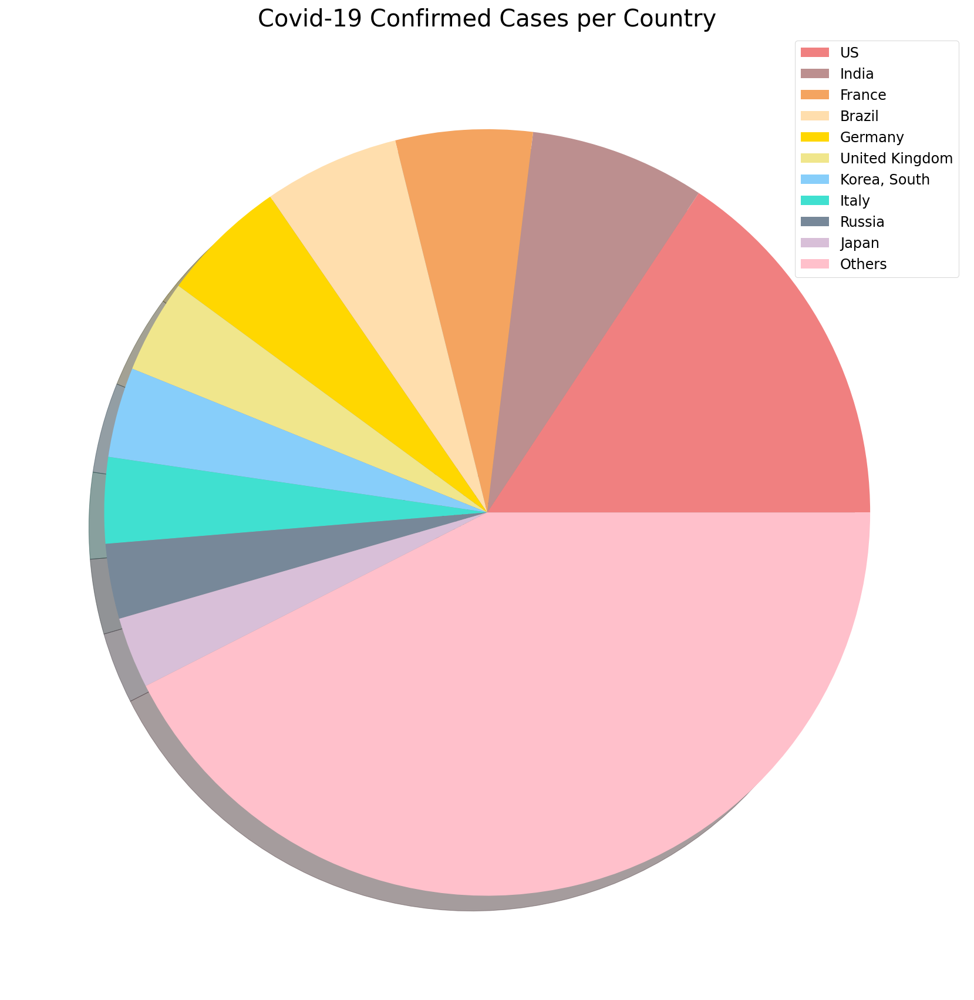

In [328]:
plot_pie_charts(visual_unique_countries, visual_confirmed_cases, 'Covid-19 Confirmed Cases per Country')

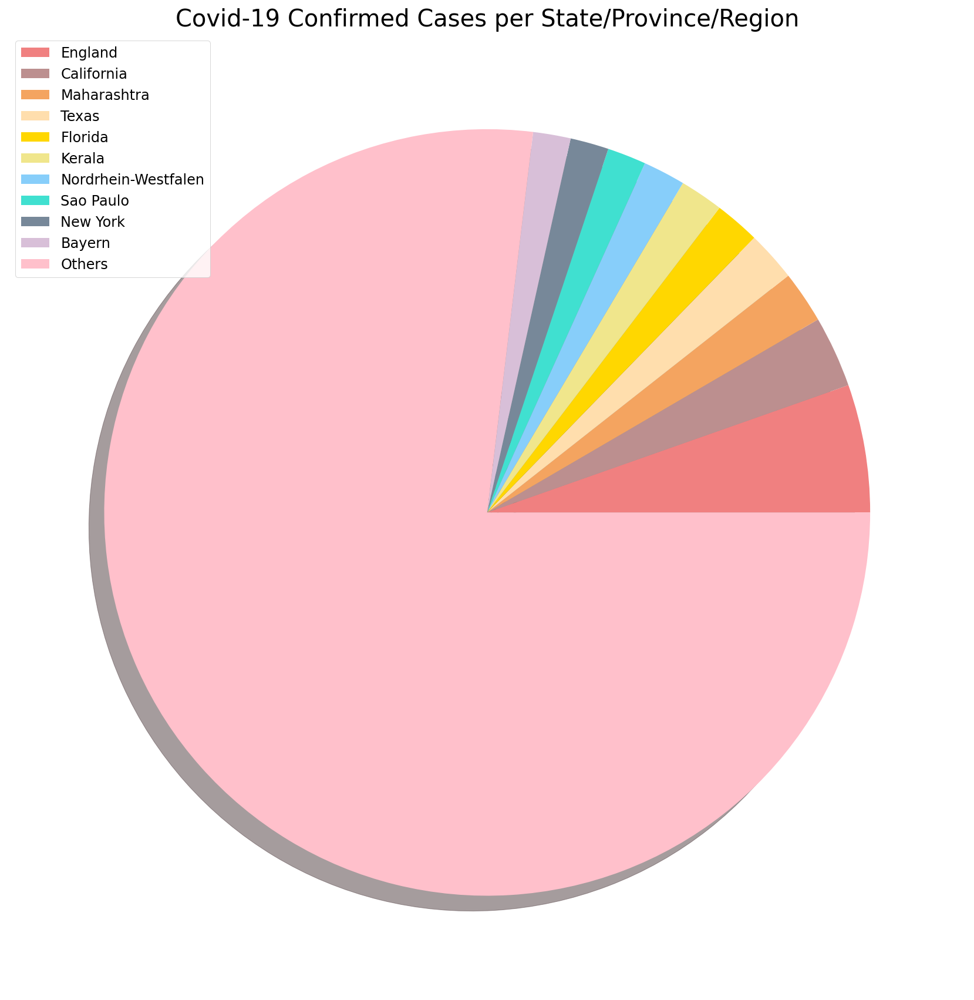

In [329]:
plot_pie_charts(visual_unique_provinces, visual_confirmed_cases2, 'Covid-19 Confirmed Cases per State/Province/Region')

In [333]:

# Trazado de países con datos regionales usando un gráfico circular

def plot_pie_country_with_regions(country_name, title):
    regions = list(latest_data[latest_data['Country_Region']==country_name]['Province_State'].unique())
    confirmed_cases = []
    no_cases = [] 
    for i in regions:
        cases = latest_data[latest_data['Province_State']==i]['Confirmed'].sum()
        if cases > 0:
            confirmed_cases.append(cases)
        else:
            no_cases.append(i)


# eliminar áreas sin casos confirmados
    for i in no_cases:
        regions.remove(i)

# mostrar solo los 5 estados principales
    regions = [k for k, v in sorted(zip(regions, confirmed_cases), key=operator.itemgetter(1), reverse=True)]

    for i in range(len(regions)):
        confirmed_cases[i] = latest_data[latest_data['Province_State']==regions[i]]['Confirmed'].sum()  
 
# provincia/estado adicional se considerará "otros"
    
    if(len(regions)>5):
        regions_5 = regions[:5]
        regions_5.append('Others')
        confirmed_cases_5 = confirmed_cases[:5]
        confirmed_cases_5.append(np.sum(confirmed_cases[5:]))
        plot_pie_charts(regions_5,confirmed_cases_5, title)
    else:
        plot_pie_charts(regions,confirmed_cases, title)

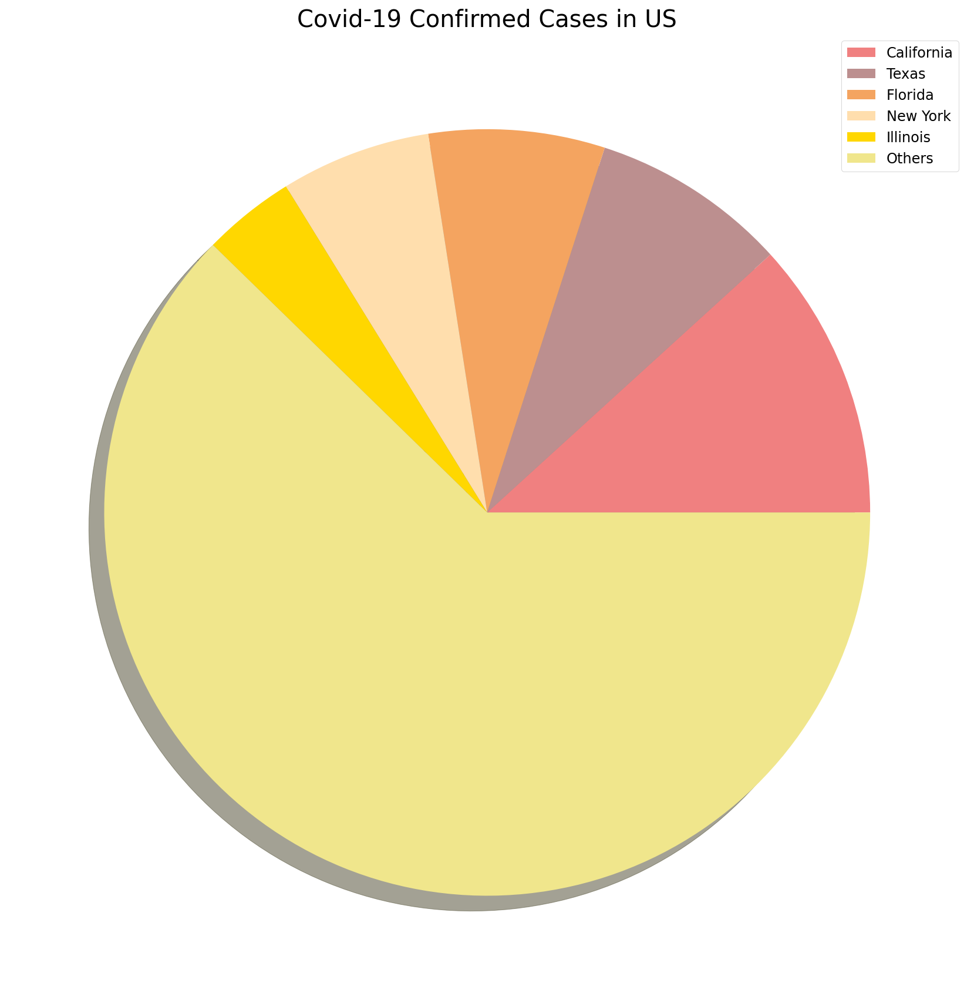

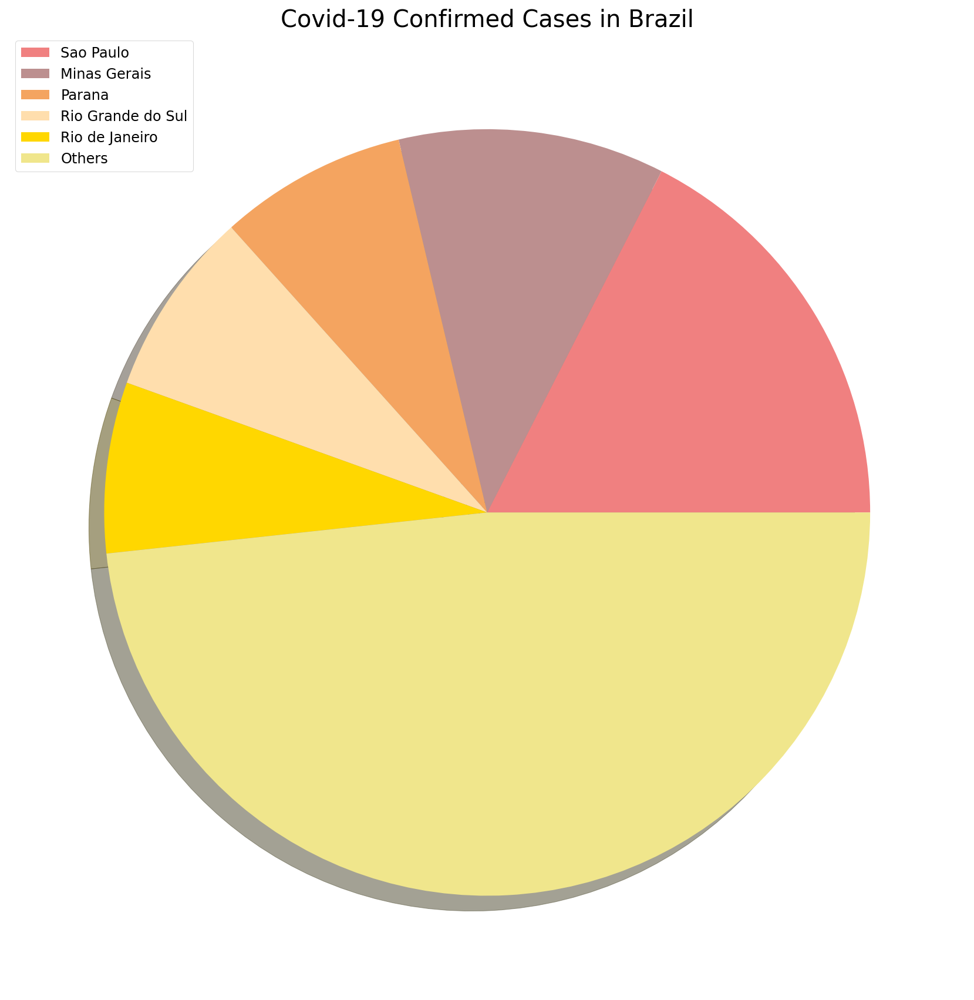

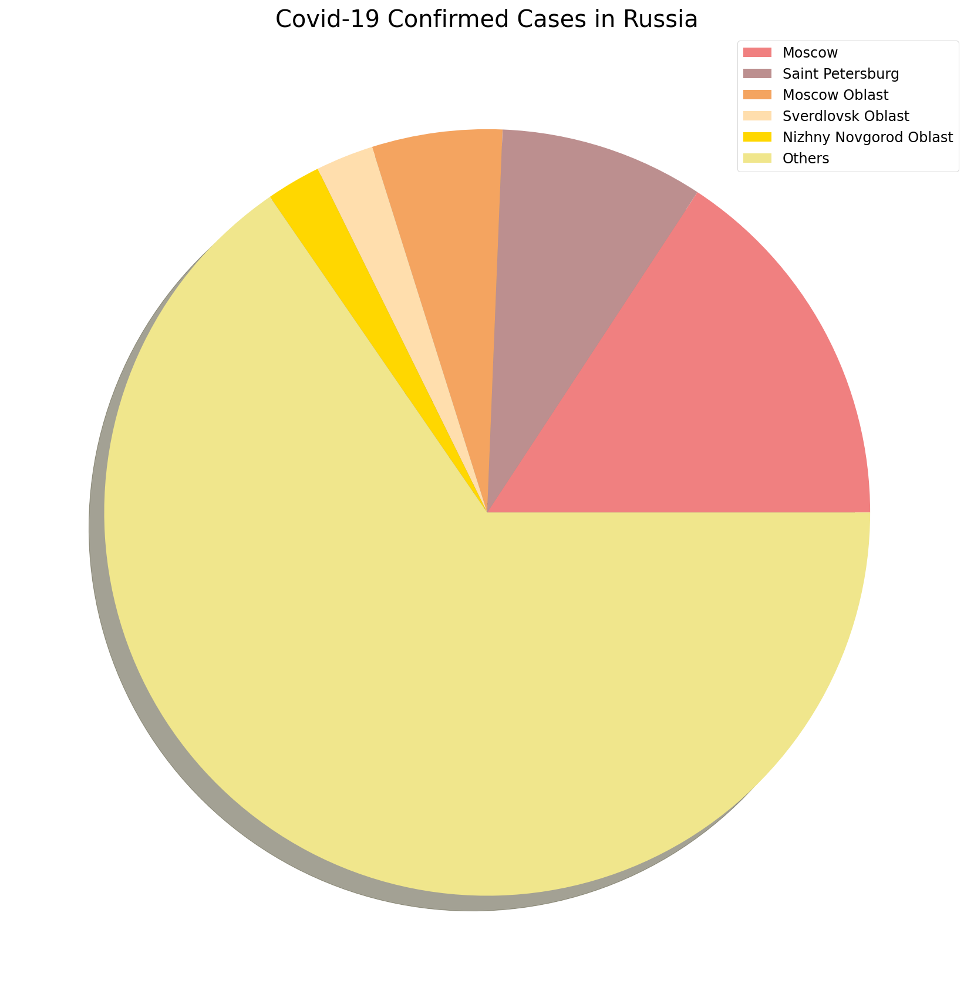

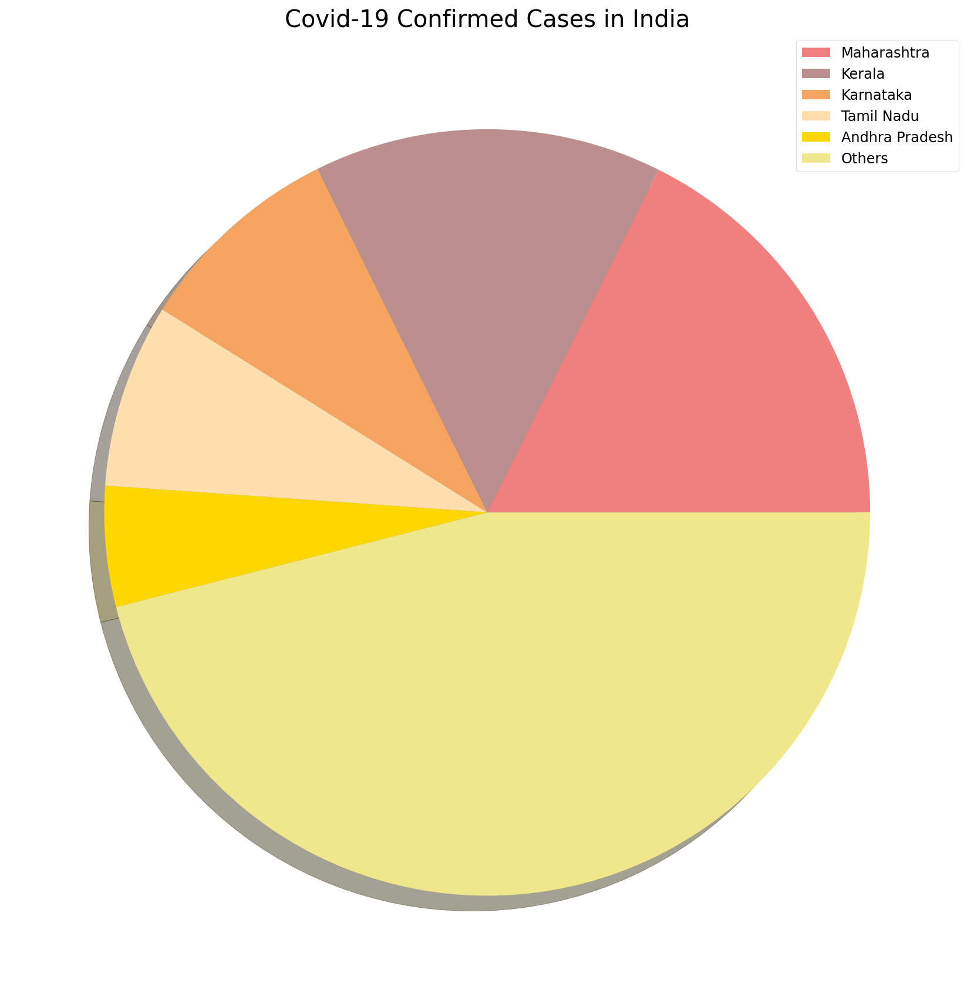

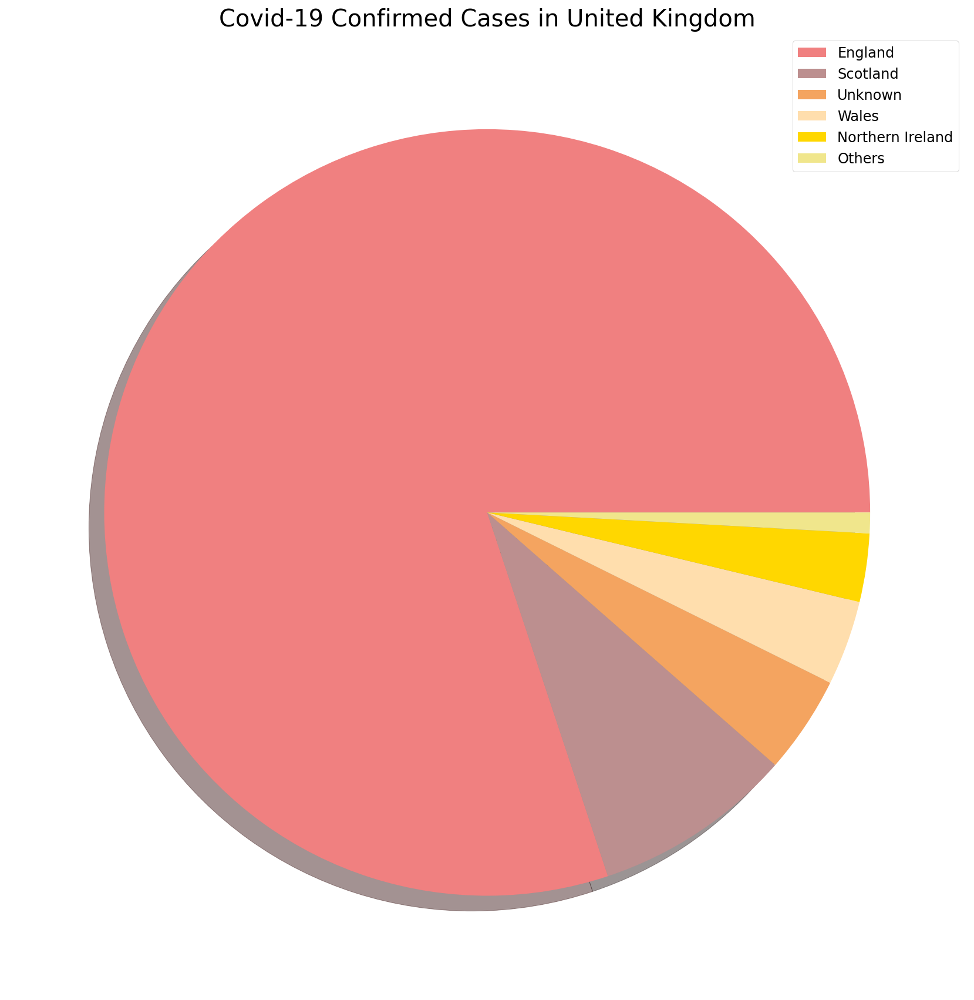

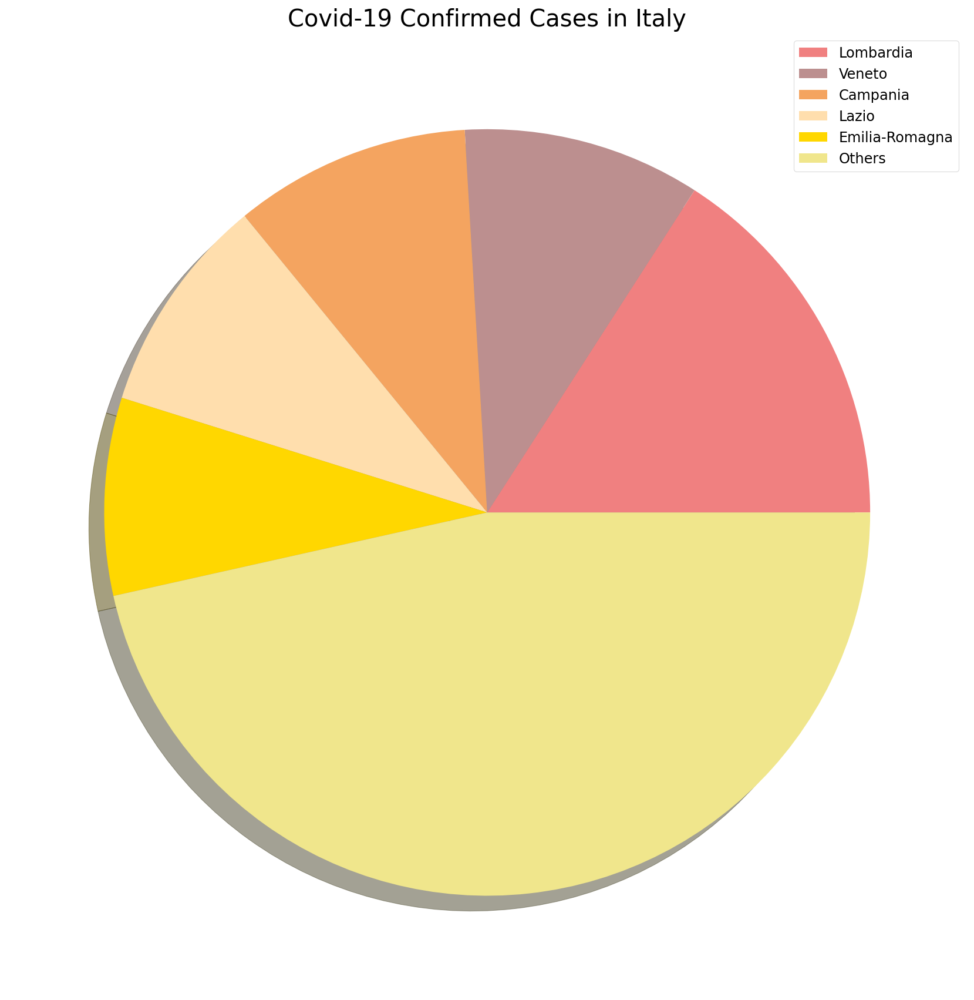

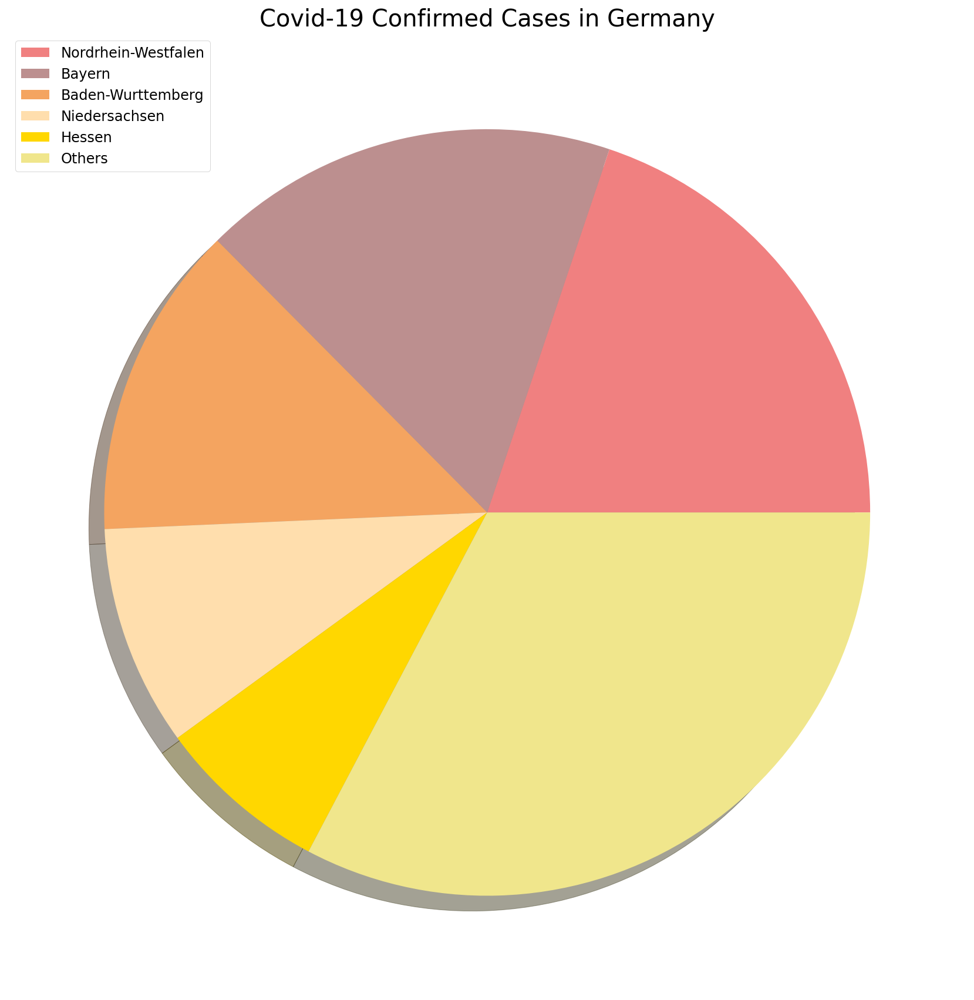

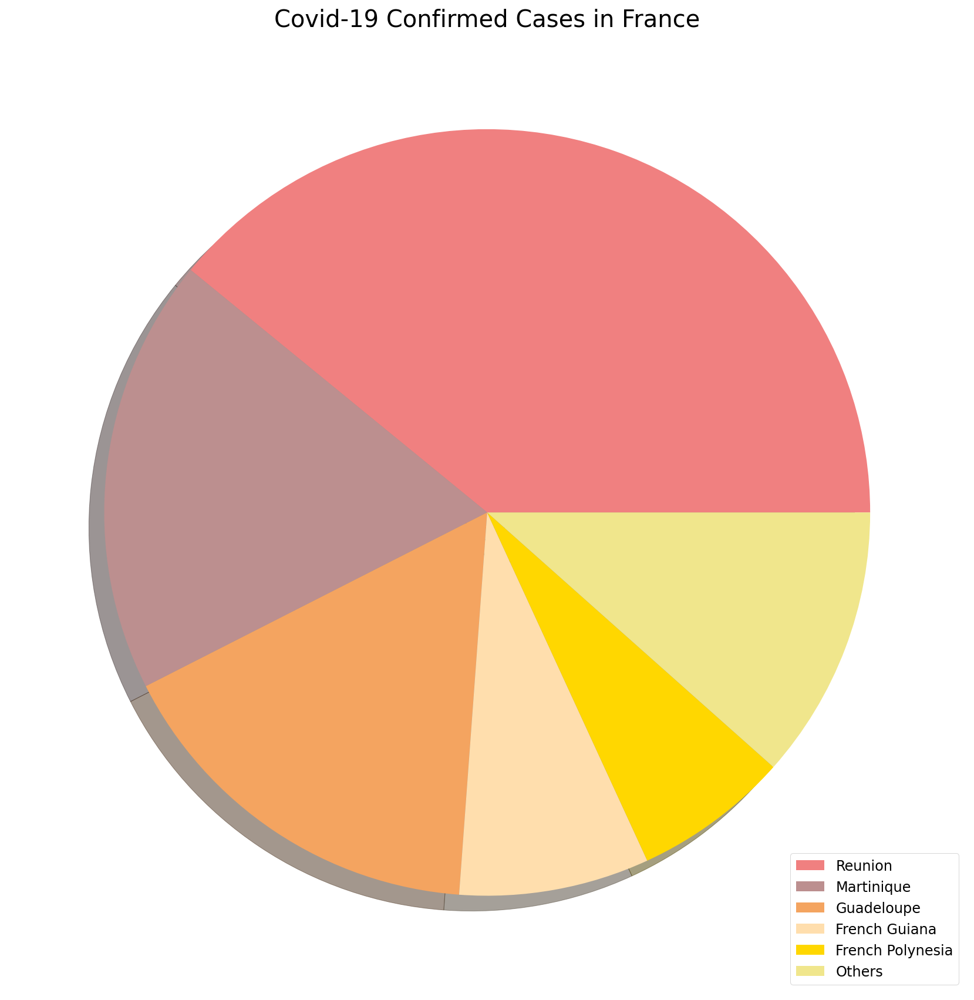

In [331]:
pie_chart_countries = ['US', 'Brazil', 'Russia', 'India', 'United Kingdom', 'Italy', 'Germany', 'France']

for i in pie_chart_countries:
    plot_pie_country_with_regions(i, 'Covid-19 Confirmed Cases in {}'.format(i))

<a id='prueba_hospitalaria'></a>
# Datos médicos de EE. UU. sobre pruebas
Esto nos brinda información sobre las pruebas de coronavirus en los EE. UU., que es importante para obtener una imagen clara de la pandemia.

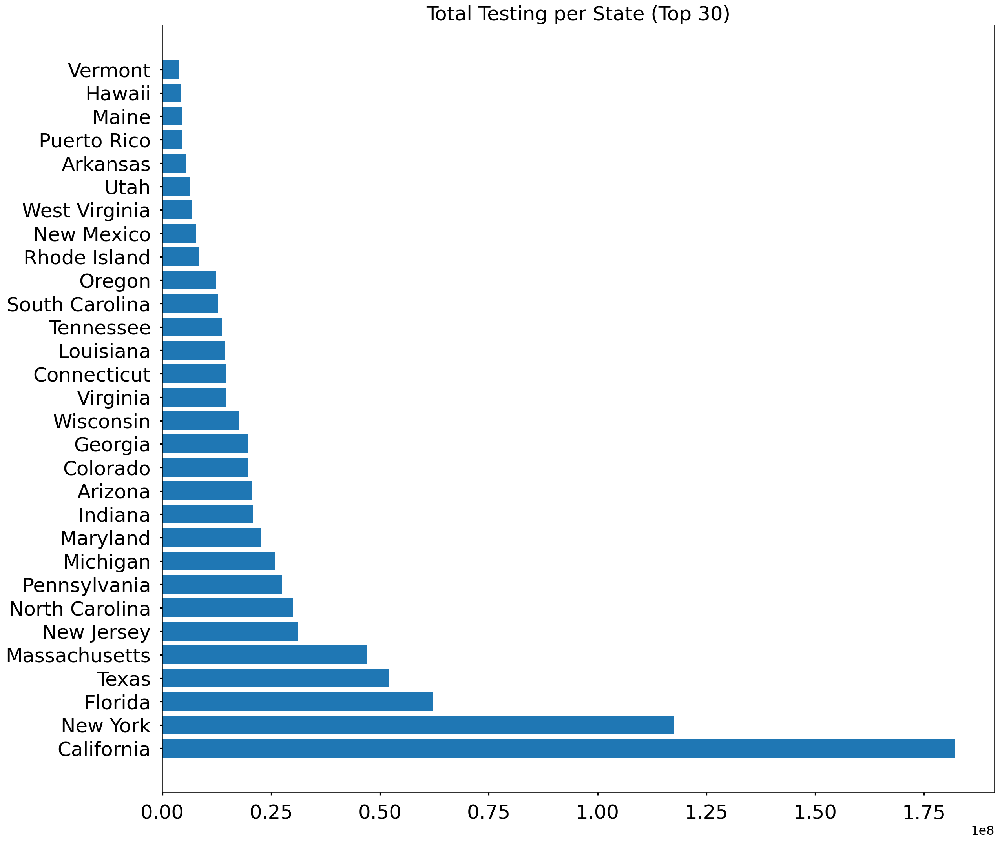

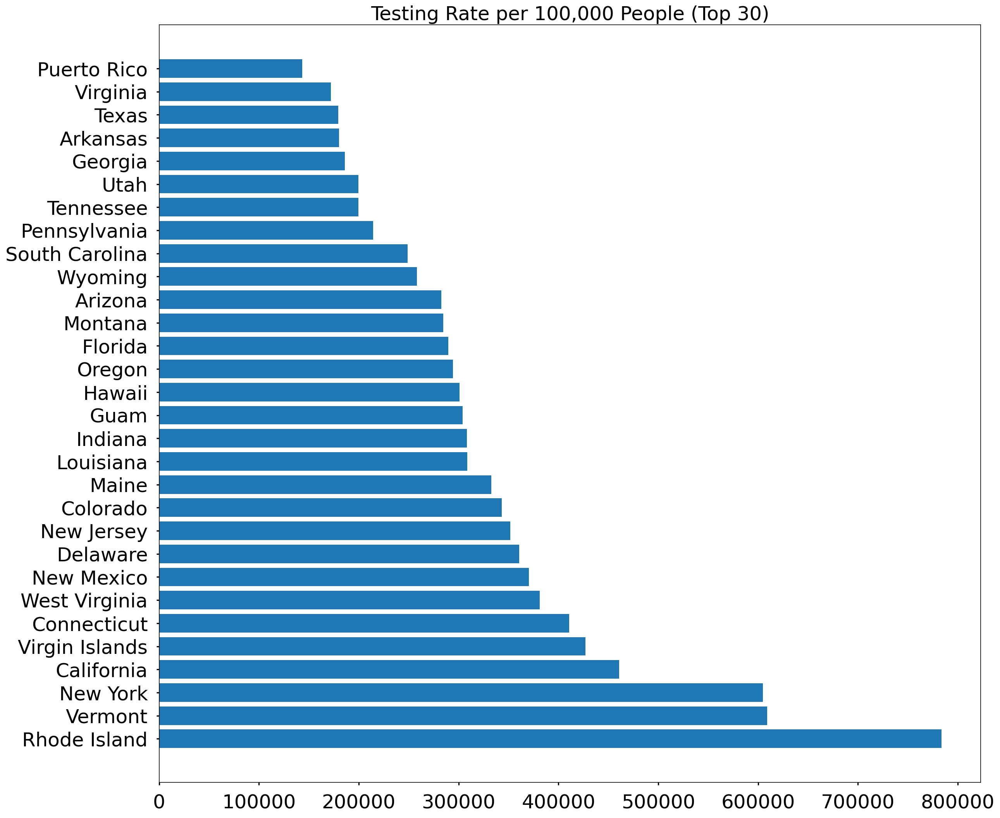

In [332]:

# Reemplazamos  nan con 0
us_medical_data.fillna(value=0, inplace=True)

def plot_us_medical_data():
    states = us_medical_data['Province_State'].unique()
    testing_number = []
    testing_rate = []
    
    for i in states:
        testing_number.append(us_medical_data[us_medical_data['Province_State']==i]['Total_Test_Results'].sum())
        testing_rate.append(us_medical_data[us_medical_data['Province_State']==i]['Testing_Rate'].max())
    
    # only show the top 15 states
    testing_states = [k for k, v in sorted(zip(states, testing_number), key=operator.itemgetter(1), reverse=True)]
    testing_rate_states = [k for k, v in sorted(zip(states, testing_rate), key=operator.itemgetter(1), reverse=True)]
  
    for i in range(len(states)):
        testing_number[i] = us_medical_data[us_medical_data['Province_State']==testing_states[i]]['Total_Test_Results'].sum()
        testing_rate[i] = us_medical_data[us_medical_data['Province_State']==testing_rate_states[i]]['Testing_Rate'].sum()
    
    top_limit = 30 
    
    plot_bar_graphs_tall(testing_states[:top_limit], testing_number[:top_limit], 'Total Testing per State (Top 30)')
    plot_bar_graphs_tall(testing_rate_states[:top_limit], testing_rate[:top_limit], 'Testing Rate per 100,000 People (Top 30)')
 

plot_us_medical_data()